# COSMOS master catalogue
## Checks and diagnostics

In [9]:
from herschelhelp_internal import git_version
print("This notebook was run with herschelhelp_internal version: \n{}".format(git_version()))

This notebook was run with herschelhelp_internal version: 
33f5ec7 (Wed Dec 6 16:56:17 2017 +0000) [with local modifications]


In [10]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import locale
locale.setlocale(locale.LC_ALL, 'en_GB')

import os
import time
import itertools

from astropy.coordinates import SkyCoord
from astropy.table import Table
from astropy import units as u
from astropy import visualization as vis
import numpy as np
from matplotlib_venn import venn3, venn2

from herschelhelp_internal.masterlist import nb_compare_mags, nb_ccplots, nb_histograms, quick_checks, find_last_ml_suffix

In [11]:
OUT_DIR = os.environ.get('OUT_DIR', "./data")
SUFFIX = find_last_ml_suffix()
#SUFFIX = "_20170815"

master_catalogue = Table.read("{}/master_catalogue_cosmos_{}.fits".format(OUT_DIR, SUFFIX))

## 0 - Quick checks

In [12]:
quick_checks(master_catalogue).show_in_notebook()

Table shows only problematic columns.


idx,Column,All nan,#Measurements,#Zeros,#Negative,Minimum value
0,ferr_ap_gpc1_g,False,124592,9,0,0.0
1,merr_ap_gpc1_g,False,124592,9,0,0.0
2,ferr_gpc1_g,False,124402,31,0,0.0
3,merr_gpc1_g,False,124402,31,0,0.0
4,ferr_ap_gpc1_r,False,131107,12,0,0.0
5,merr_ap_gpc1_r,False,131107,12,0,0.0
6,ferr_gpc1_r,False,130849,14,0,0.0
7,merr_gpc1_r,False,130849,14,0,0.0
8,ferr_ap_gpc1_i,False,131010,53,0,0.0
9,merr_ap_gpc1_i,False,131010,53,0,0.0


## I - Summary of wavelength domains

In [13]:
flag_obs = master_catalogue['flag_optnir_obs']
flag_det = master_catalogue['flag_optnir_det']

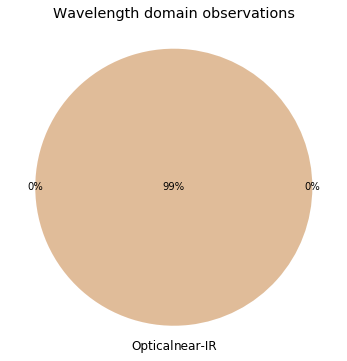

In [14]:
venn2(
    [
        np.sum(flag_obs == 1),
        np.sum(flag_obs == 2),
        np.sum(flag_obs == 3)
    ],
    set_labels=('Optical', 'near-IR'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/len(flag_obs)))
)
plt.title("Wavelength domain observations");

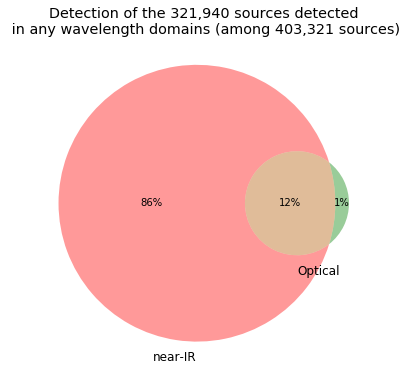

In [15]:
venn2(
    [
        np.sum(flag_det[flag_obs == 3] == 1),
        np.sum(flag_det[flag_obs == 3] == 2),
        np.sum(flag_det[flag_obs == 3] == 3)
    ],
    set_labels=('near-IR', 'Optical'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/np.sum(flag_det != 0)))
)
plt.title("Detection of the {} sources detected\n in any wavelength domains "
          "(among {} sources)".format(
              locale.format('%d', np.sum(flag_det != 0), grouping=True),
              locale.format('%d', len(flag_det), grouping=True)));

## II - Comparing magnitudes in similar filters

The master list if composed of several catalogues containing magnitudes in similar filters on different instruments. We are comparing the magnitudes in these corresponding filters.

In [16]:
u_bands = ["Megacam u",            "KIDS u"]
g_bands = ["Megacam g", "DECam g", "KIDS g", "SUPRIME g", "GPC1 g"]
r_bands = ["Megacam r", "DECam r", "KIDS r", "SUPRIME r", "GPC1 r"]
i_bands = ["Megacam i", "DECam i", "KIDS i", "SUPRIME i", "GPC1 i"]
z_bands = ["Megacam z", "DECam z",           "SUPRIME z", "GPC1 z"]
y_bands = [             "DECam y",           "SUPRIME y", "GPC1 y"]

### II.a - Comparing depths

We compare the histograms of the total aperture magnitudes of similar bands.

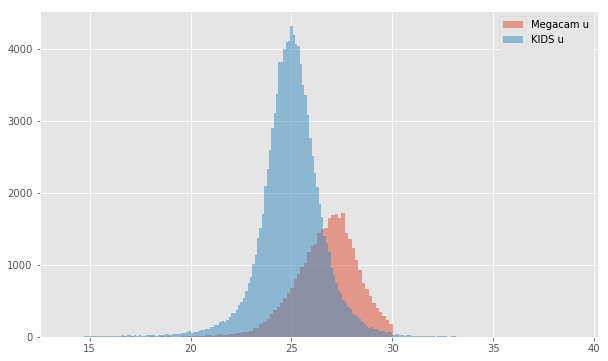

HELP warning: the column m_decam_g (DECam g) is empty.


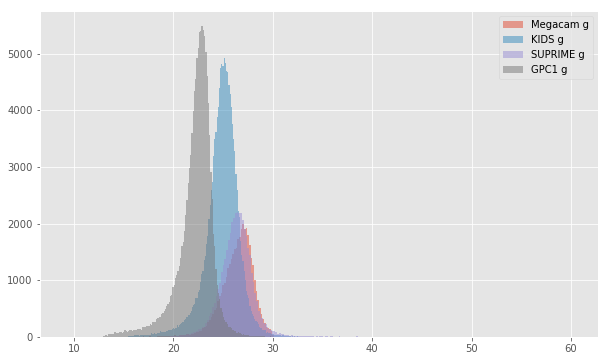

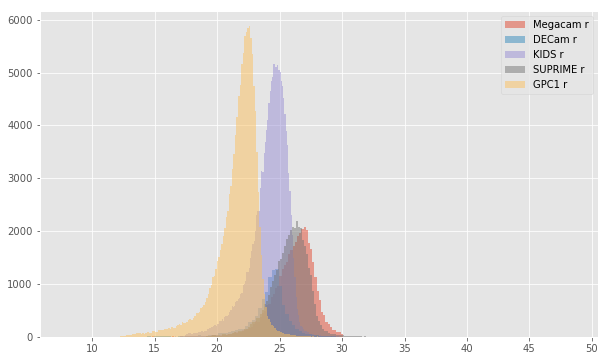

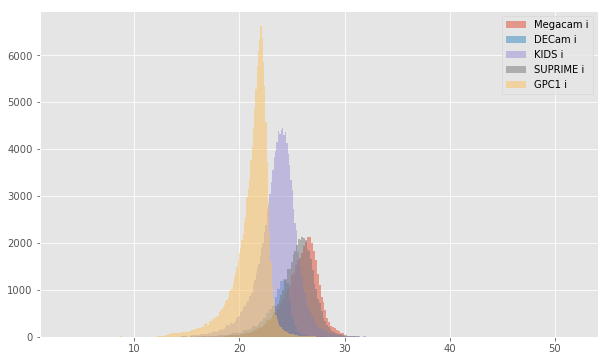

HELP warning: the column m_decam_z (DECam z) is empty.


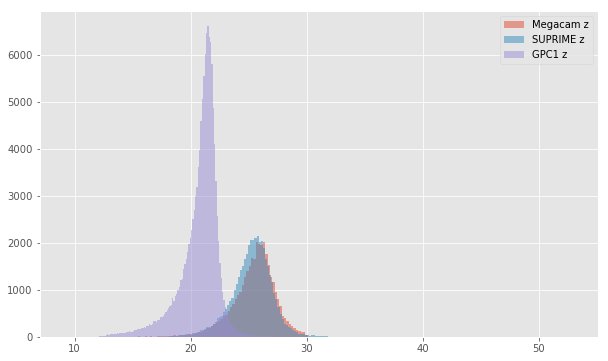

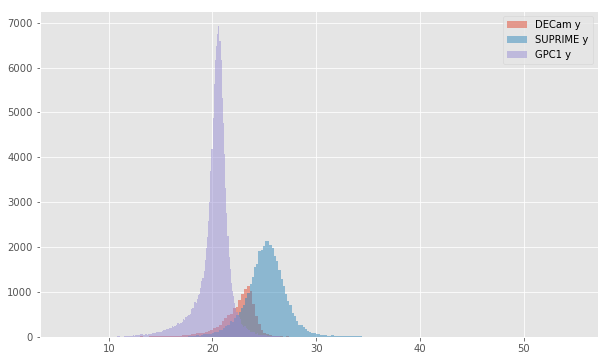

In [18]:
for bands in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    colnames = ["m_{}".format(band.replace(" ", "_").lower()) for band in bands]
    nb_histograms(master_catalogue, colnames, bands)

### II.b - Comparing magnitudes

We compare one to one each magnitude in similar bands.

KIDS u (aperture) - Megacam u (aperture):
- Median: 0.14
- Median Absolute Deviation: 0.41
- 1% percentile: -2.2474838256835934
- 99% percentile: 2.621225929260253


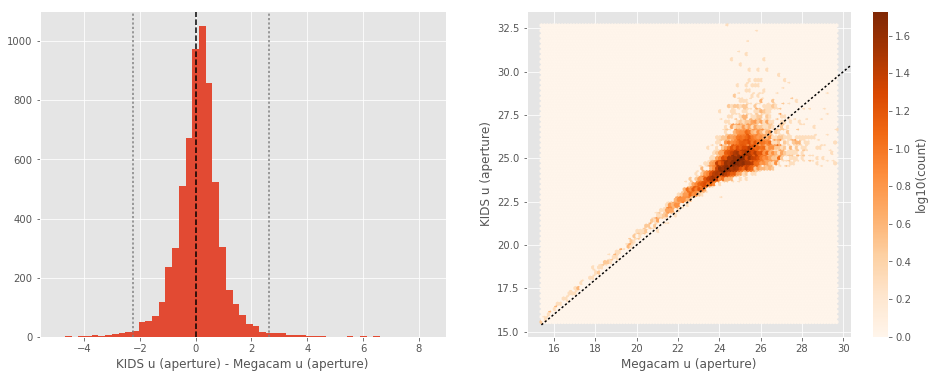

KIDS u (total) - Megacam u (total):
- Median: 0.29
- Median Absolute Deviation: 0.43
- 1% percentile: -1.9380467987060546
- 99% percentile: 3.5206631469726566


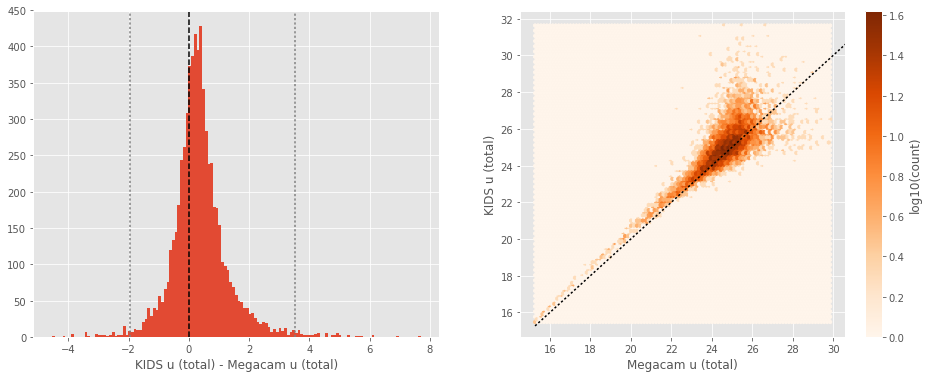

No sources have both Megacam g (aperture) and DECam g (aperture) values.
No sources have both Megacam g (total) and DECam g (total) values.
KIDS g (aperture) - Megacam g (aperture):
- Median: 0.20
- Median Absolute Deviation: 0.20
- 1% percentile: -0.8258655548095702
- 99% percentile: 2.024257278442383


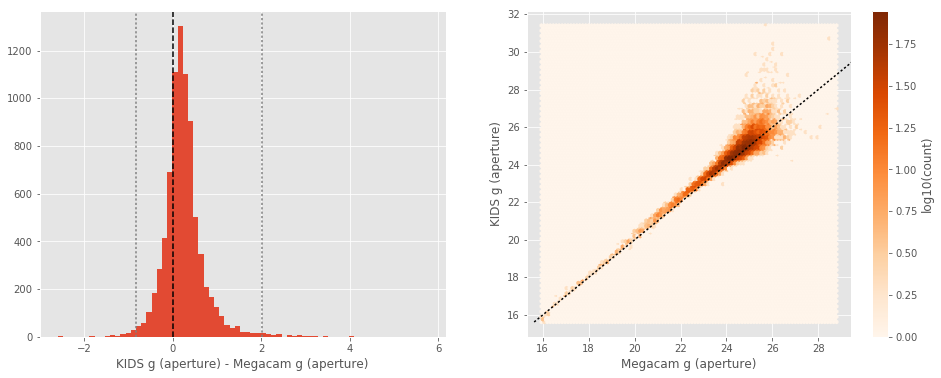

KIDS g (total) - Megacam g (total):
- Median: 0.49
- Median Absolute Deviation: 0.29
- 1% percentile: -0.38678871154785155
- 99% percentile: 3.1281341552734374


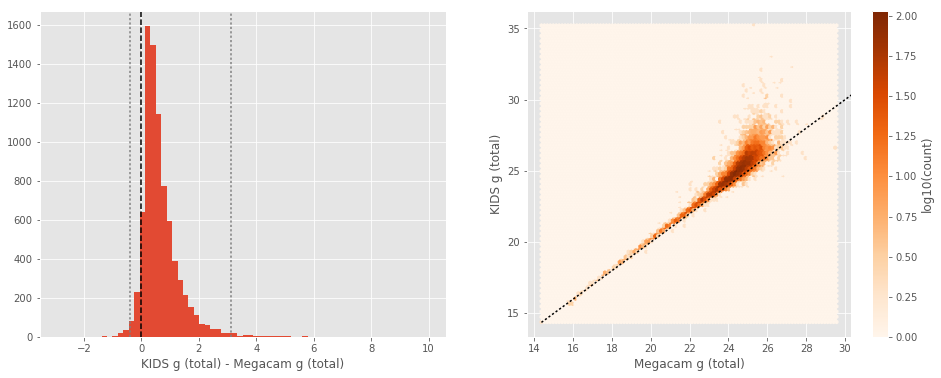

SUPRIME g (aperture) - Megacam g (aperture):
- Median: -0.02
- Median Absolute Deviation: 0.17
- 1% percentile: -1.2993405151367186
- 99% percentile: 1.4006728744506598


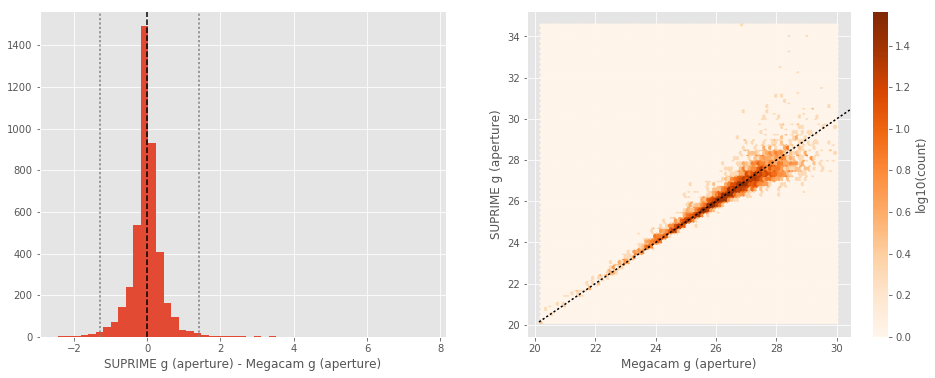

SUPRIME g (total) - Megacam g (total):
- Median: -0.04
- Median Absolute Deviation: 0.21
- 1% percentile: -2.1838512420654297
- 99% percentile: 1.6905517578125


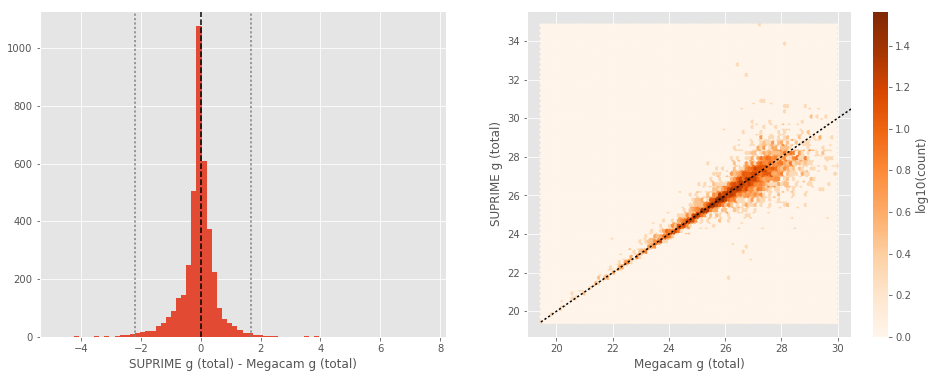

GPC1 g (aperture) - Megacam g (aperture):
- Median: -0.17
- Median Absolute Deviation: 0.29
- 1% percentile: -3.114044704437256
- 99% percentile: 2.6236631584167442


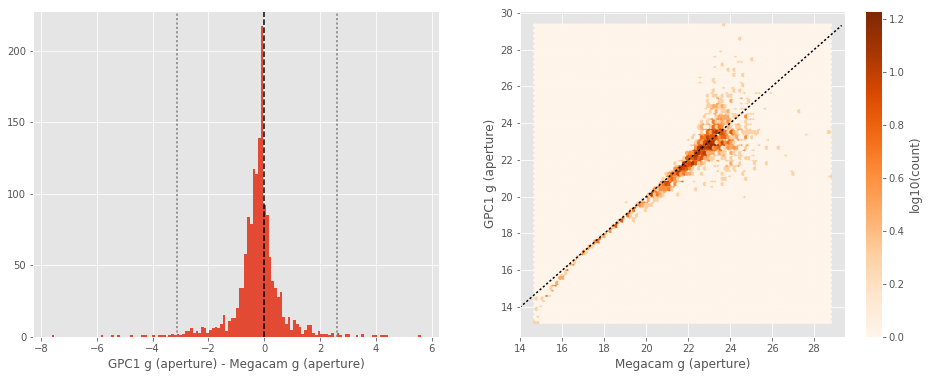

GPC1 g (total) - Megacam g (total):
- Median: 0.05
- Median Absolute Deviation: 0.25
- 1% percentile: -3.5495959091186524
- 99% percentile: 2.2622415542602536


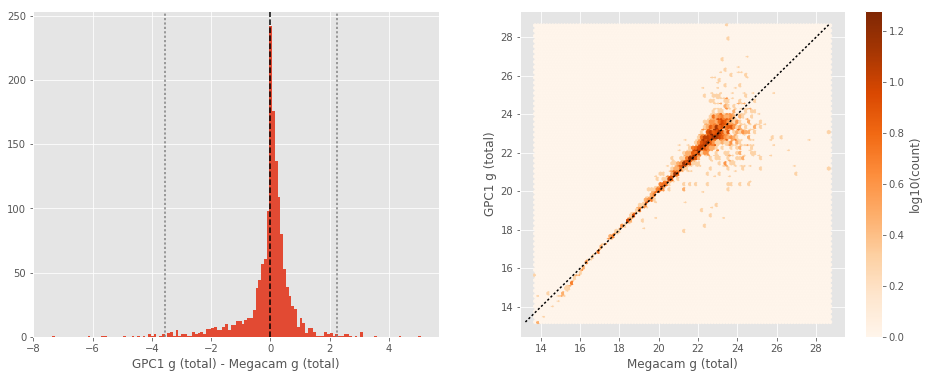

No sources have both DECam g (aperture) and KIDS g (aperture) values.
No sources have both DECam g (total) and KIDS g (total) values.
No sources have both DECam g (aperture) and SUPRIME g (aperture) values.
No sources have both DECam g (total) and SUPRIME g (total) values.
No sources have both DECam g (aperture) and GPC1 g (aperture) values.
No sources have both DECam g (total) and GPC1 g (total) values.
SUPRIME g (aperture) - KIDS g (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.21
- 1% percentile: -2.0319047164916992
- 99% percentile: 9.623511466979997


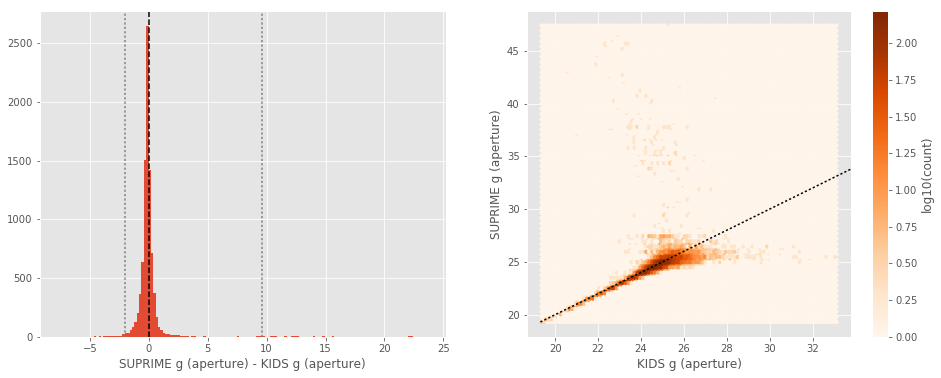

SUPRIME g (total) - KIDS g (total):
- Median: -0.45
- Median Absolute Deviation: 0.32
- 1% percentile: -3.1784239196777344
- 99% percentile: 3.0462038803100593


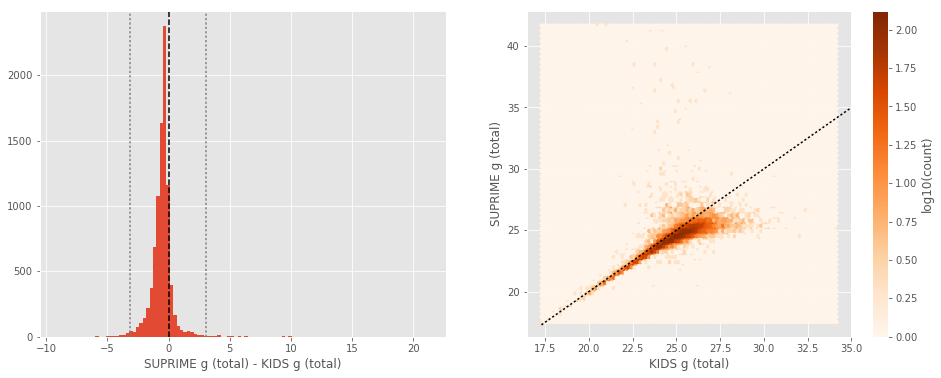

GPC1 g (aperture) - KIDS g (aperture):
- Median: -0.38
- Median Absolute Deviation: 0.38
- 1% percentile: -3.0911411285400394
- 99% percentile: 2.433734035491942


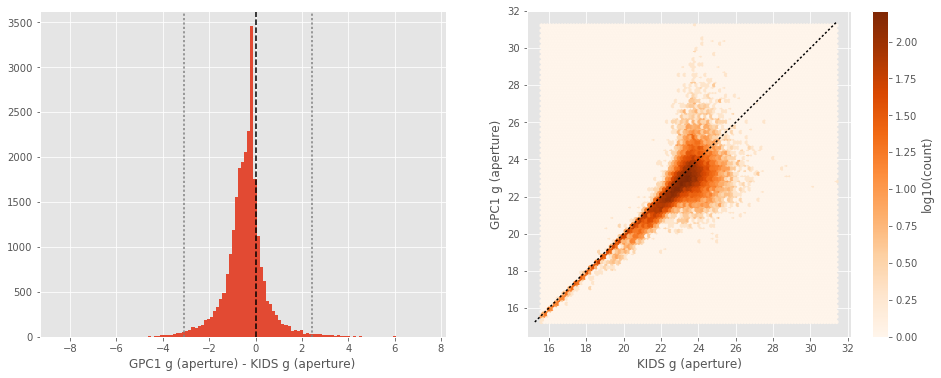

GPC1 g (total) - KIDS g (total):
- Median: -0.18
- Median Absolute Deviation: 0.29
- 1% percentile: -3.887268829345703
- 99% percentile: 1.9006595611572246


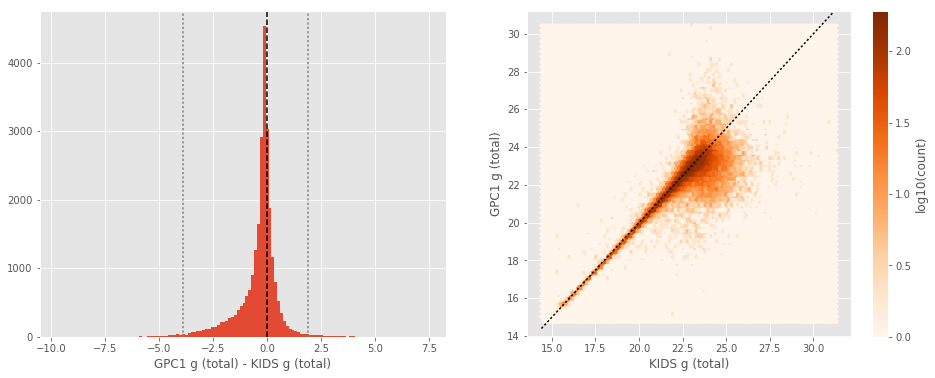

GPC1 g (aperture) - SUPRIME g (aperture):
- Median: -0.28
- Median Absolute Deviation: 0.49
- 1% percentile: -15.379793319702149
- 99% percentile: 2.972028083801269


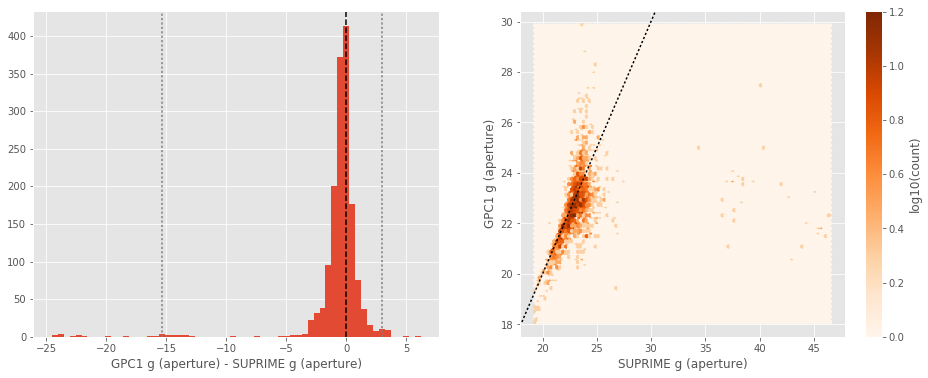

GPC1 g (total) - SUPRIME g (total):
- Median: 0.05
- Median Absolute Deviation: 0.36
- 1% percentile: -6.392880172729492
- 99% percentile: 3.2303747558593647


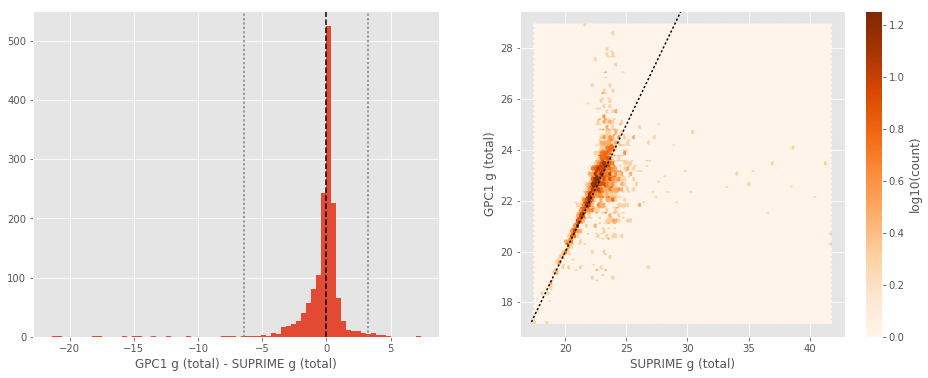

DECam r (aperture) - Megacam r (aperture):
- Median: 0.64
- Median Absolute Deviation: 0.40
- 1% percentile: -0.5352429389953614
- 99% percentile: 3.622565650939945


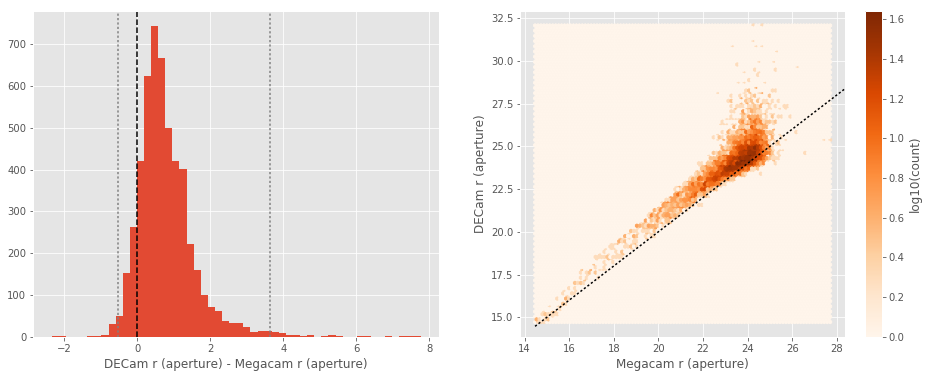

DECam r (total) - Megacam r (total):
- Median: 0.84
- Median Absolute Deviation: 0.37
- 1% percentile: -0.17060942649841307
- 99% percentile: 3.5327812385558977


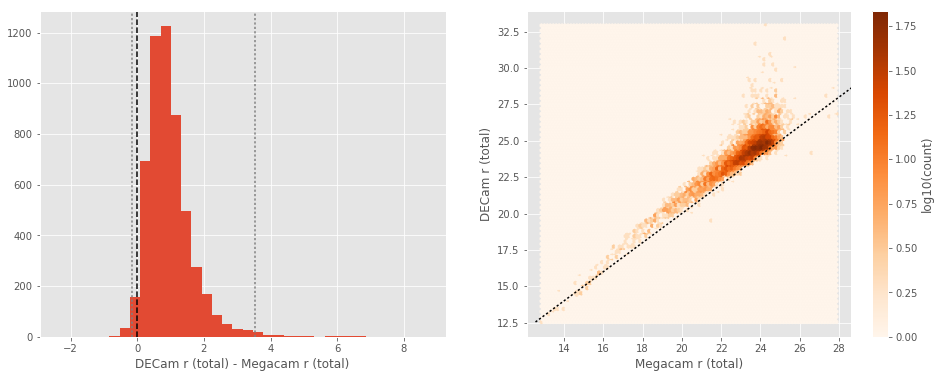

KIDS r (aperture) - Megacam r (aperture):
- Median: 0.07
- Median Absolute Deviation: 0.13
- 1% percentile: -0.6619827270507812
- 99% percentile: 0.9236923217773448


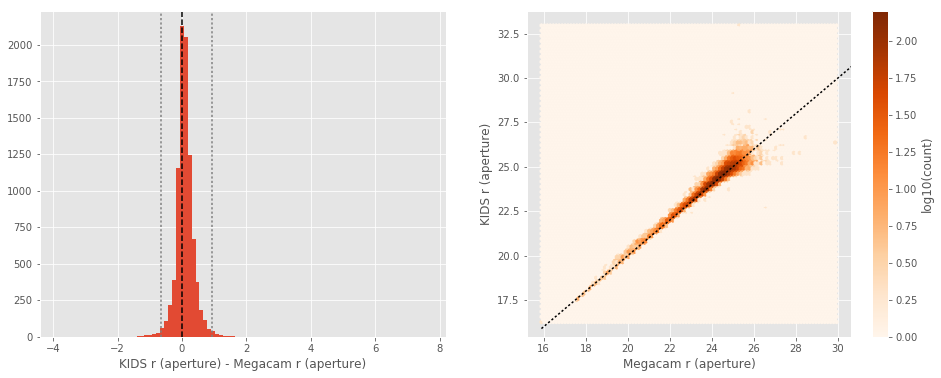

KIDS r (total) - Megacam r (total):
- Median: 0.20
- Median Absolute Deviation: 0.17
- 1% percentile: -0.4563820266723633
- 99% percentile: 1.3168539810180664


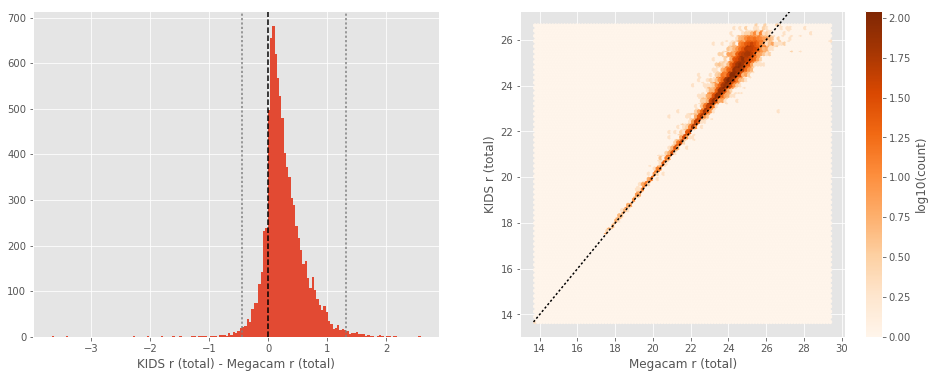

SUPRIME r (aperture) - Megacam r (aperture):
- Median: -0.06
- Median Absolute Deviation: 0.16
- 1% percentile: -1.4689391326904297
- 99% percentile: 1.035515899658201


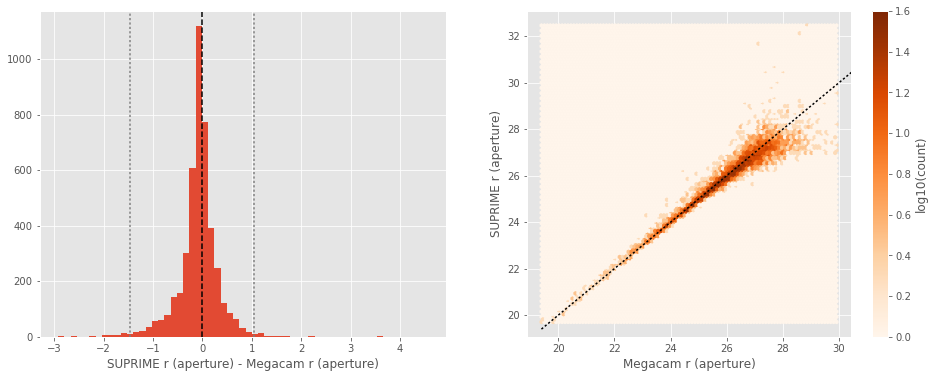

SUPRIME r (total) - Megacam r (total):
- Median: -0.13
- Median Absolute Deviation: 0.19
- 1% percentile: -2.3003128814697265
- 99% percentile: 1.6185663604736398


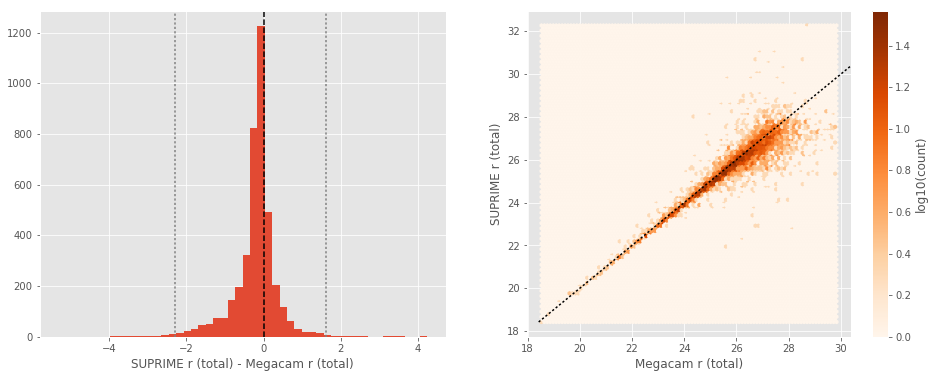

GPC1 r (aperture) - Megacam r (aperture):
- Median: -0.11
- Median Absolute Deviation: 0.19
- 1% percentile: -1.9647608184814451
- 99% percentile: 1.5951990699768066


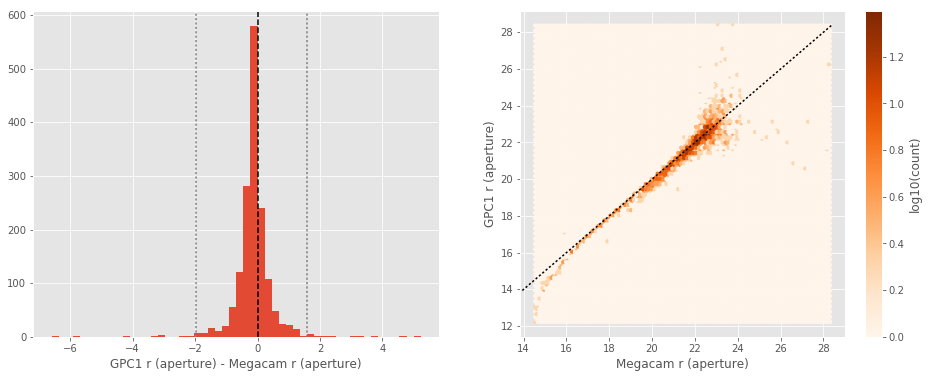

GPC1 r (total) - Megacam r (total):
- Median: 0.10
- Median Absolute Deviation: 0.14
- 1% percentile: -2.1760643959045414
- 99% percentile: 1.3360236167907737


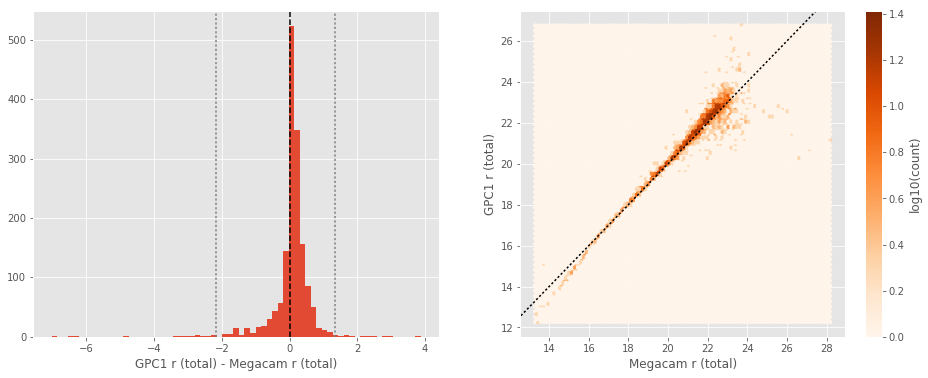

KIDS r (aperture) - DECam r (aperture):
- Median: -0.55
- Median Absolute Deviation: 0.44
- 1% percentile: -3.5634124755859373
- 99% percentile: 0.7849642944335937


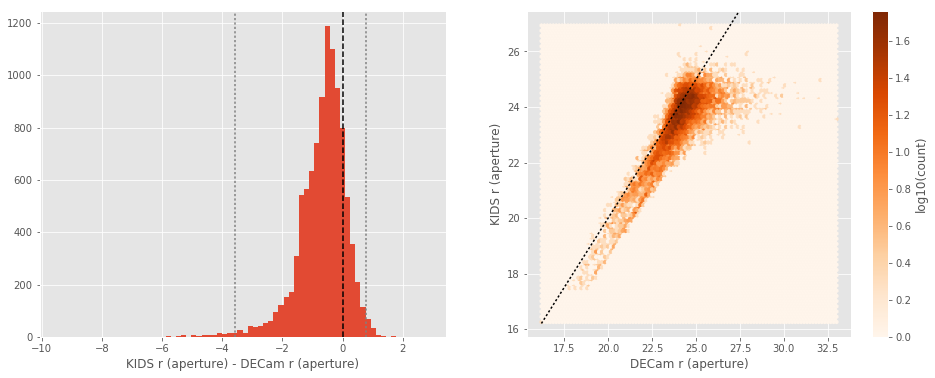

KIDS r (total) - DECam r (total):
- Median: -0.66
- Median Absolute Deviation: 0.40
- 1% percentile: -3.121302452087402
- 99% percentile: 0.6847688674926731


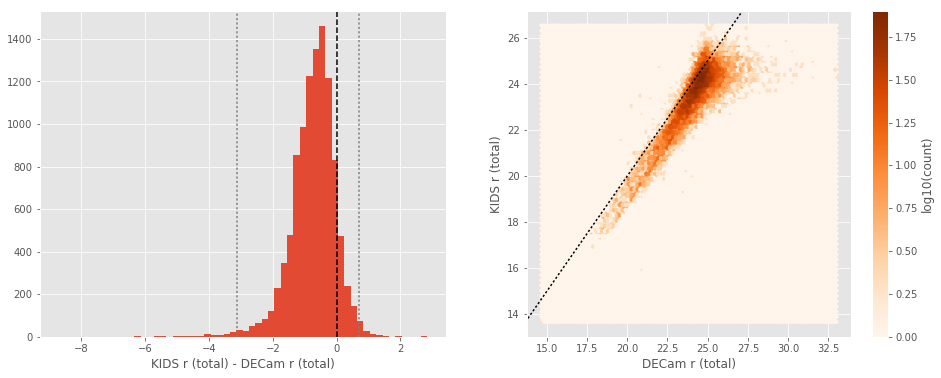

SUPRIME r (aperture) - DECam r (aperture):
- Median: -0.58
- Median Absolute Deviation: 0.41
- 1% percentile: -3.511433410644531
- 99% percentile: 0.8780738830566397


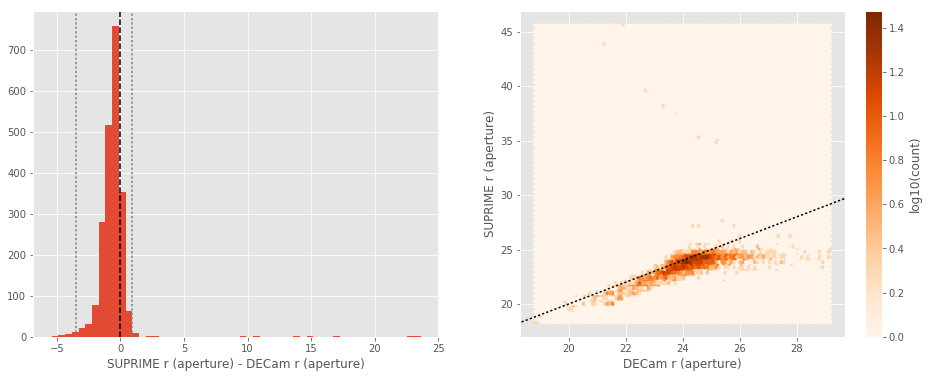

SUPRIME r (total) - DECam r (total):
- Median: -0.90
- Median Absolute Deviation: 0.35
- 1% percentile: -3.524937629699707
- 99% percentile: 0.3532109260559082


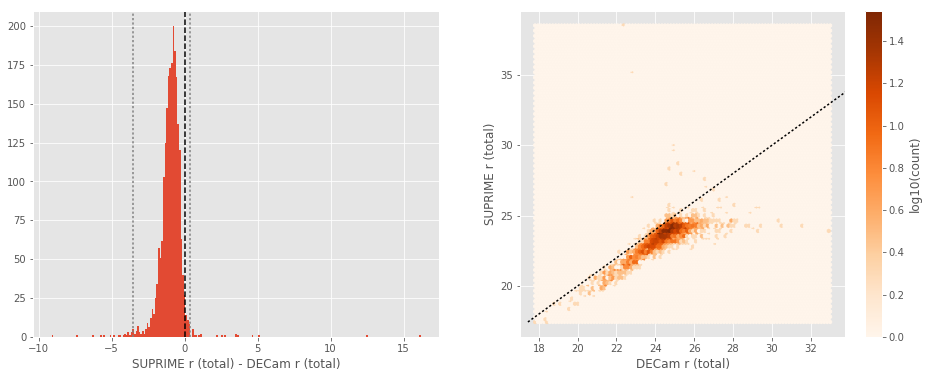

GPC1 r (aperture) - DECam r (aperture):
- Median: -1.00
- Median Absolute Deviation: 0.39
- 1% percentile: -3.3693375015258793
- 99% percentile: 0.9309371376037588


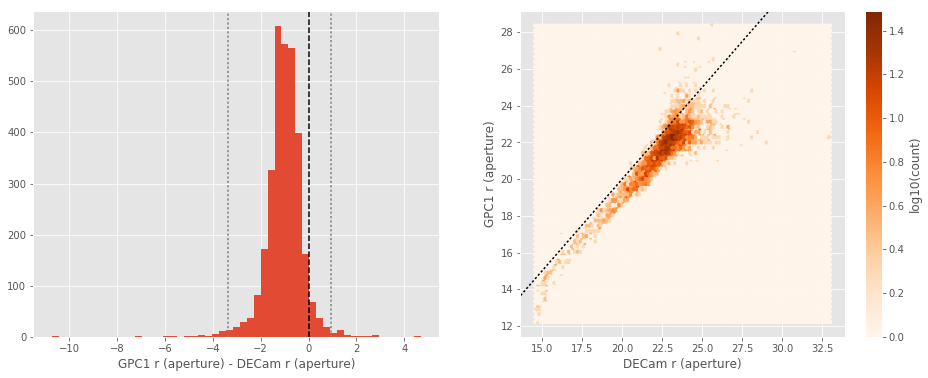

GPC1 r (total) - DECam r (total):
- Median: -0.91
- Median Absolute Deviation: 0.39
- 1% percentile: -3.5831480026245117
- 99% percentile: 0.4732389450073242


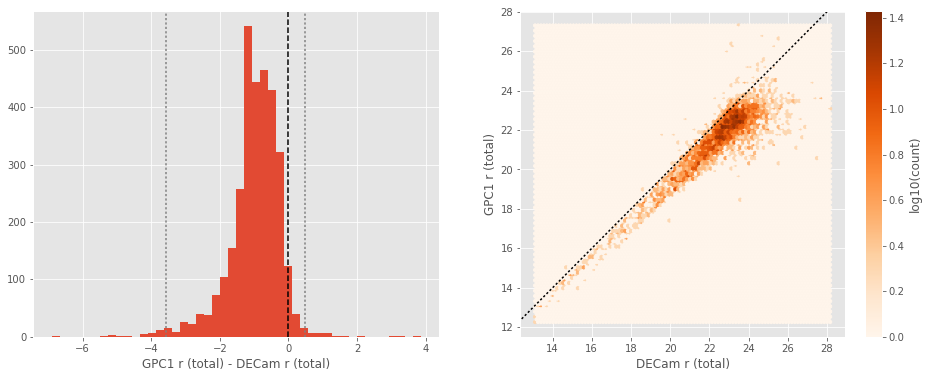

SUPRIME r (aperture) - KIDS r (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.12
- 1% percentile: -0.8773091125488282
- 99% percentile: 9.820415039062507


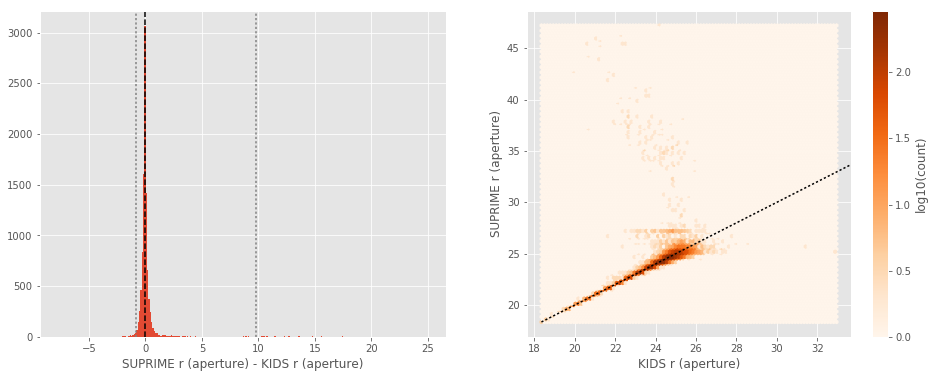

SUPRIME r (total) - KIDS r (total):
- Median: -0.25
- Median Absolute Deviation: 0.19
- 1% percentile: -1.4127513122558595
- 99% percentile: 3.5642600440978978


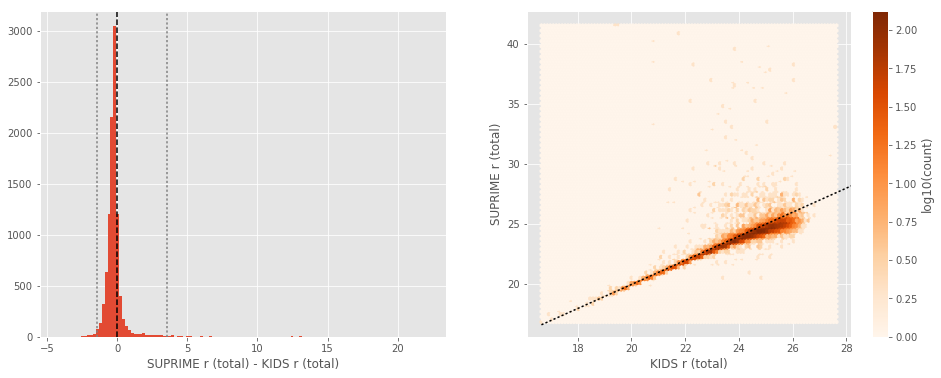

GPC1 r (aperture) - KIDS r (aperture):
- Median: -0.15
- Median Absolute Deviation: 0.26
- 1% percentile: -1.7597206115722657
- 99% percentile: 1.6044371795654309


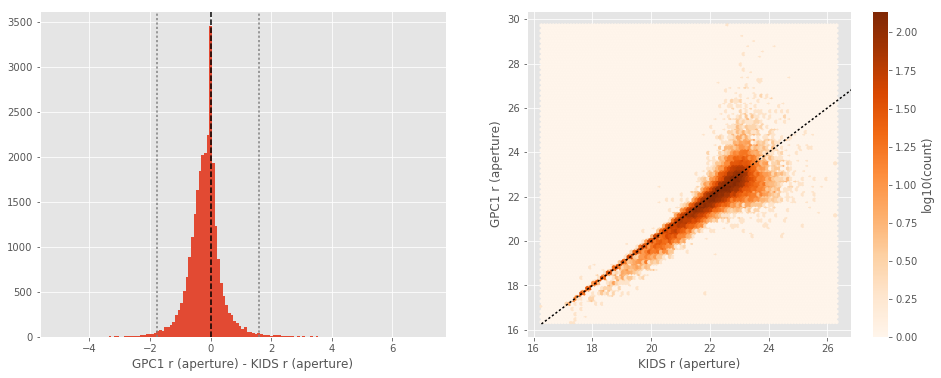

GPC1 r (total) - KIDS r (total):
- Median: 0.05
- Median Absolute Deviation: 0.16
- 1% percentile: -2.2661289024353026
- 99% percentile: 1.210830211639397


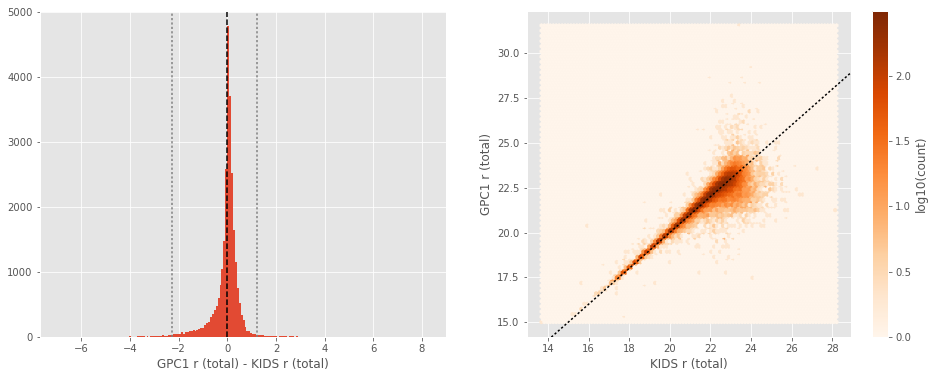

GPC1 r (aperture) - SUPRIME r (aperture):
- Median: -0.12
- Median Absolute Deviation: 0.31
- 1% percentile: -16.056880950927734
- 99% percentile: 1.8380117416381836


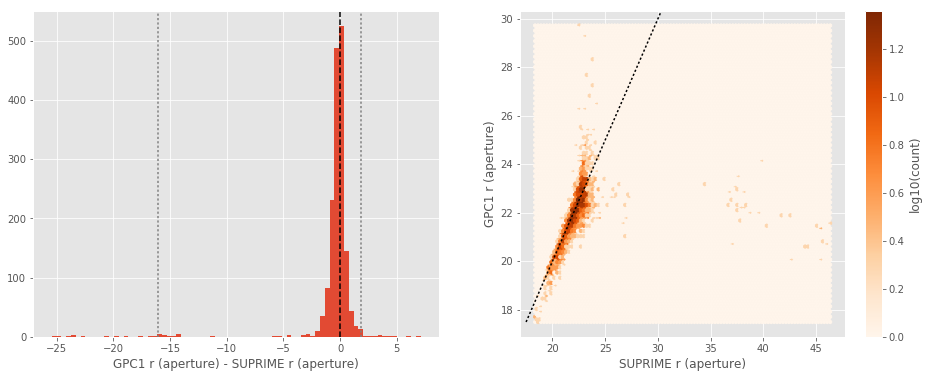

GPC1 r (total) - SUPRIME r (total):
- Median: 0.17
- Median Absolute Deviation: 0.19
- 1% percentile: -5.866987857818604
- 99% percentile: 1.3877723312377936


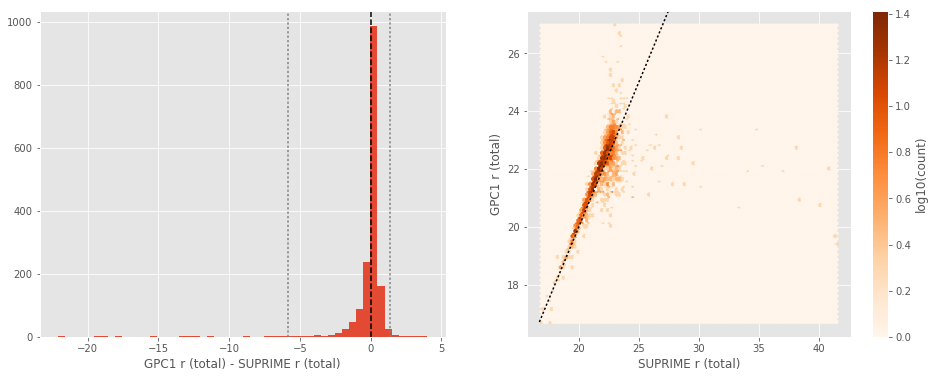

DECam i (aperture) - Megacam i (aperture):
- Median: 0.45
- Median Absolute Deviation: 0.32
- 1% percentile: -0.4540670585632324
- 99% percentile: 3.0284647369384765


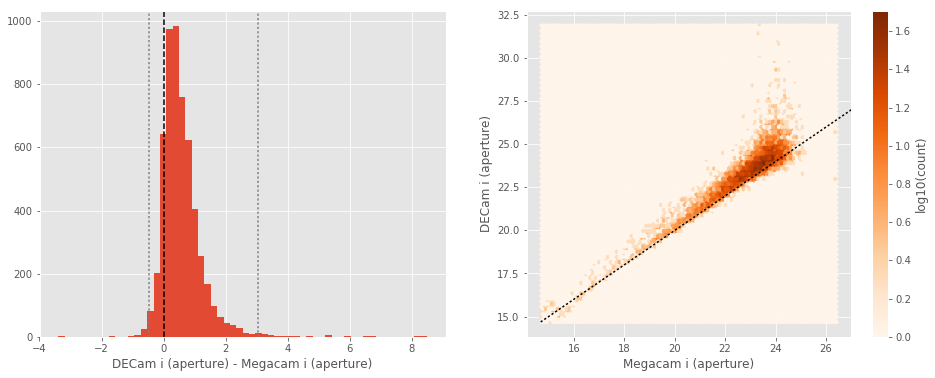

DECam i (total) - Megacam i (total):
- Median: 0.59
- Median Absolute Deviation: 0.31
- 1% percentile: -0.40878448486328123
- 99% percentile: 2.360998153686519


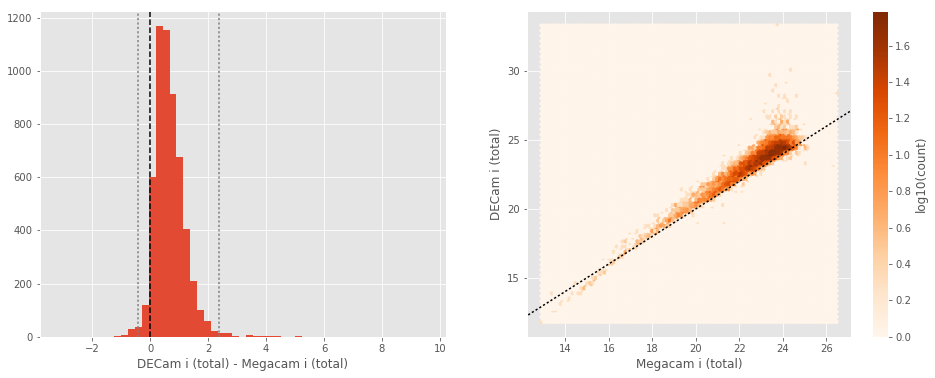

KIDS i (aperture) - Megacam i (aperture):
- Median: 0.10
- Median Absolute Deviation: 0.24
- 1% percentile: -1.2916680145263673
- 99% percentile: 2.387491455078125


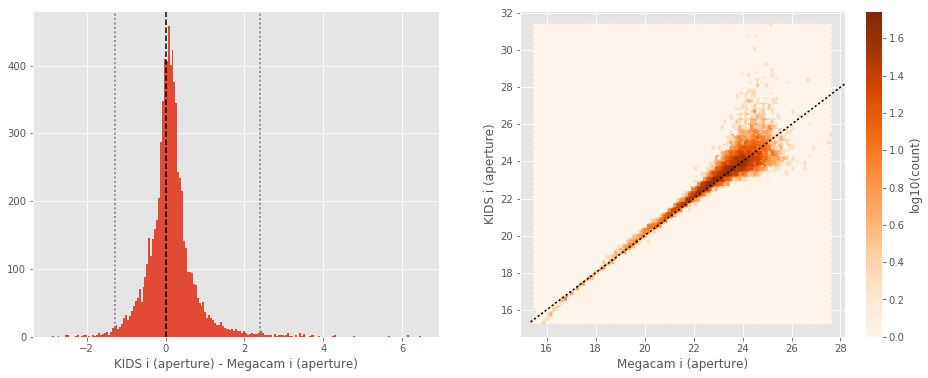

KIDS i (total) - Megacam i (total):
- Median: 0.29
- Median Absolute Deviation: 0.29
- 1% percentile: -0.7711979103088379
- 99% percentile: 3.1604197311401343


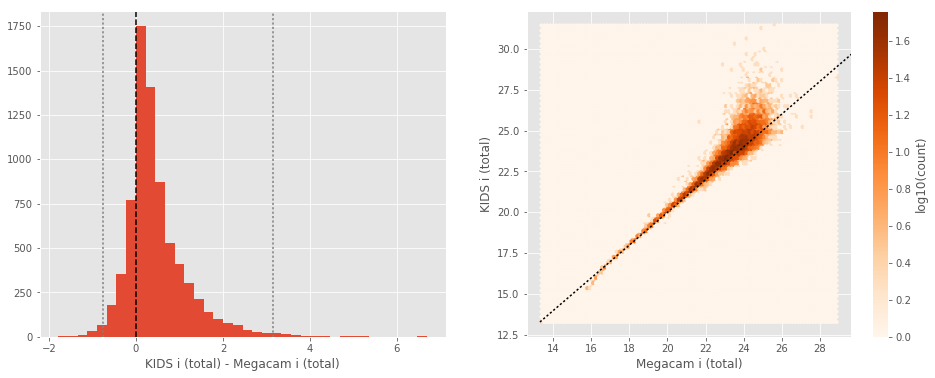

SUPRIME i (aperture) - Megacam i (aperture):
- Median: -0.03
- Median Absolute Deviation: 0.16
- 1% percentile: -1.7509864425659178
- 99% percentile: 1.2390918540954627


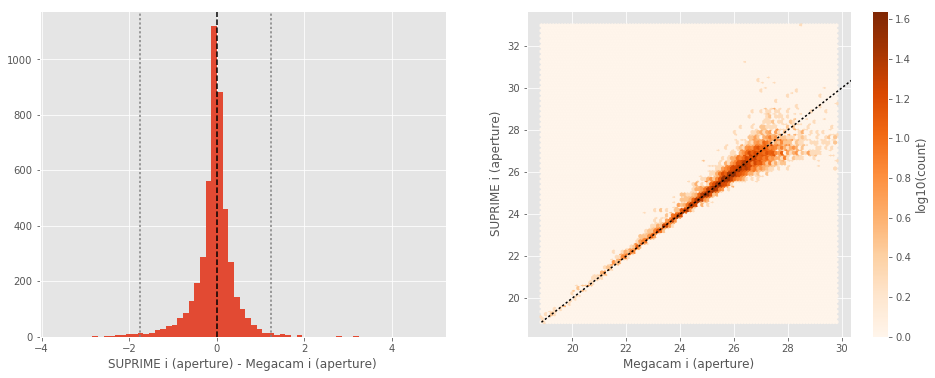

SUPRIME i (total) - Megacam i (total):
- Median: -0.10
- Median Absolute Deviation: 0.20
- 1% percentile: -2.2564786529541014
- 99% percentile: 1.5472450256347579


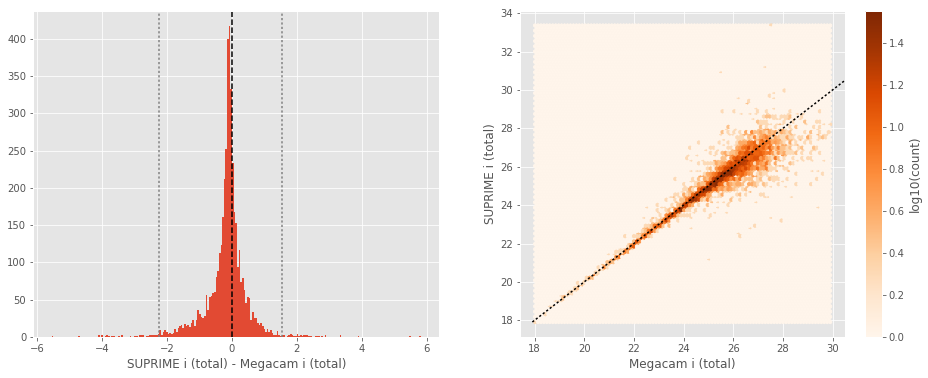

GPC1 i (aperture) - Megacam i (aperture):
- Median: -0.10
- Median Absolute Deviation: 0.13
- 1% percentile: -1.2581596755981446
- 99% percentile: 1.1812555313110347


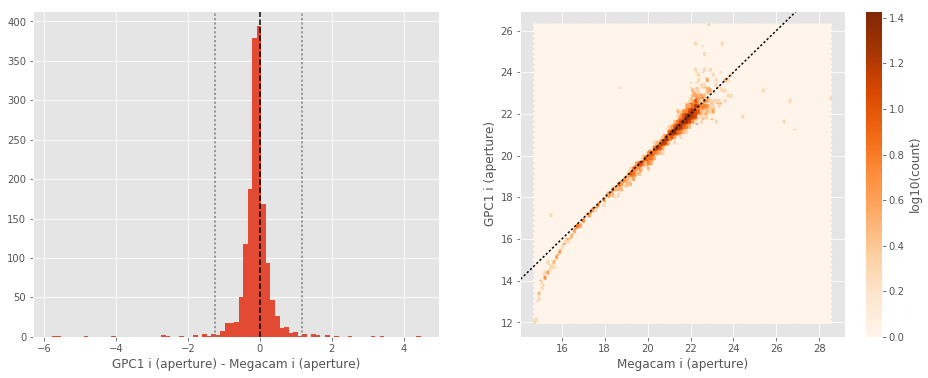

GPC1 i (total) - Megacam i (total):
- Median: 0.17
- Median Absolute Deviation: 0.13
- 1% percentile: -0.8481235885620116
- 99% percentile: 0.914428787231443


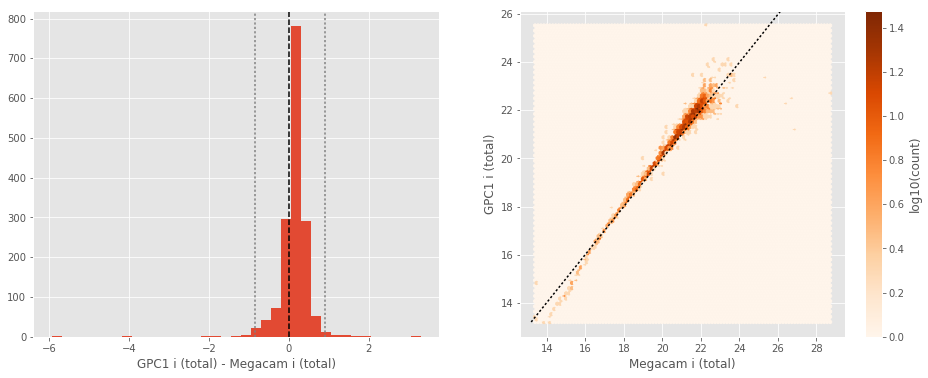

KIDS i (aperture) - DECam i (aperture):
- Median: -0.31
- Median Absolute Deviation: 0.36
- 1% percentile: -2.7085586547851563
- 99% percentile: 1.542315673828131


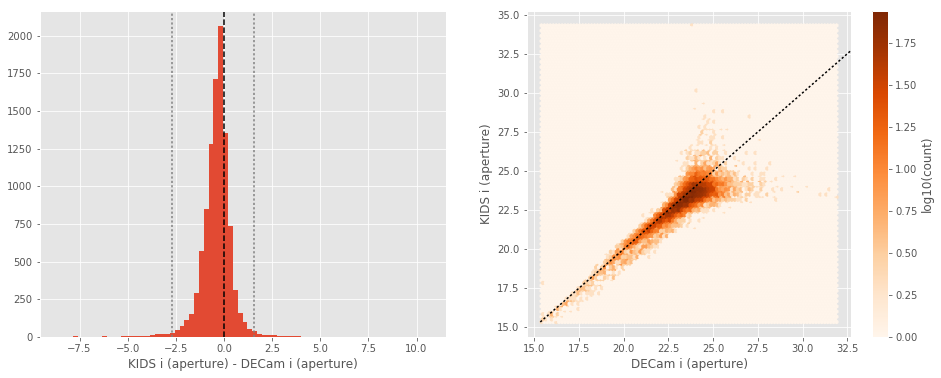

KIDS i (total) - DECam i (total):
- Median: -0.29
- Median Absolute Deviation: 0.34
- 1% percentile: -1.7017856025695801
- 99% percentile: 2.1928584480285647


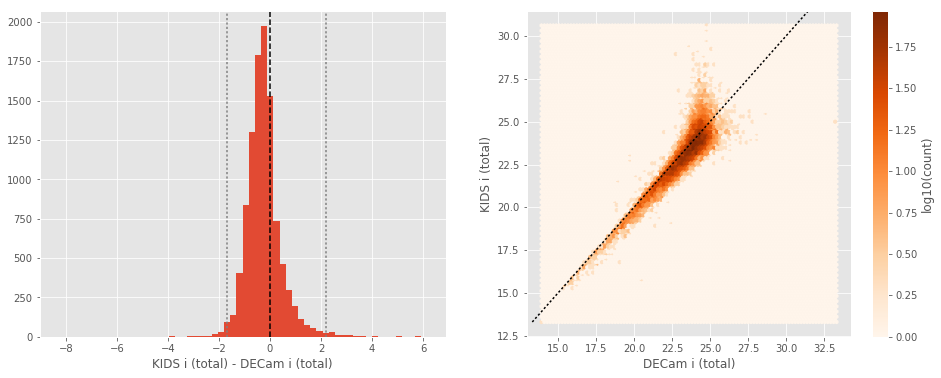

SUPRIME i (aperture) - DECam i (aperture):
- Median: -0.39
- Median Absolute Deviation: 0.34
- 1% percentile: -3.0578268432617186
- 99% percentile: 0.8178524017333966


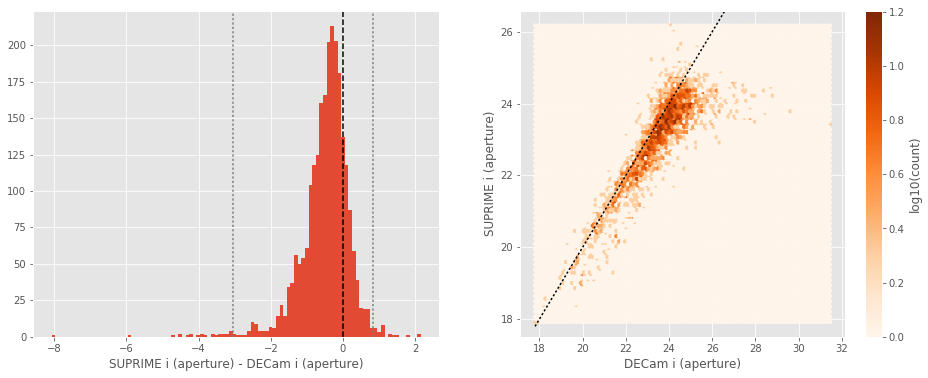

SUPRIME i (total) - DECam i (total):
- Median: -0.62
- Median Absolute Deviation: 0.29
- 1% percentile: -2.2816339111328126
- 99% percentile: 0.4992142105102473


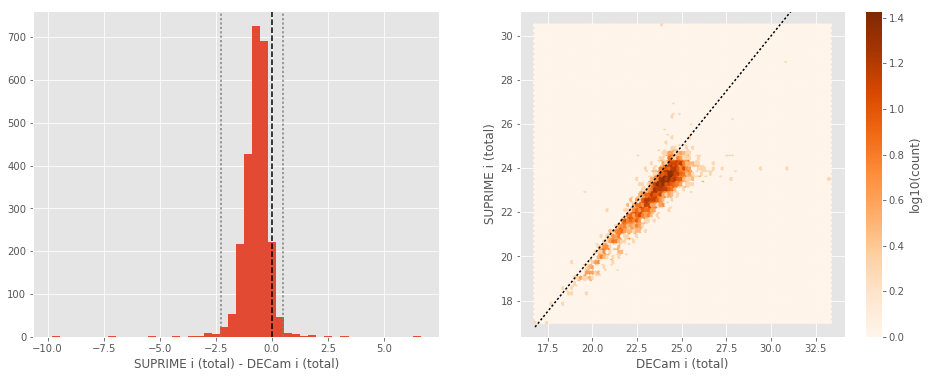

GPC1 i (aperture) - DECam i (aperture):
- Median: -0.47
- Median Absolute Deviation: 0.26
- 1% percentile: -2.141335639953613
- 99% percentile: 0.6670423507690422


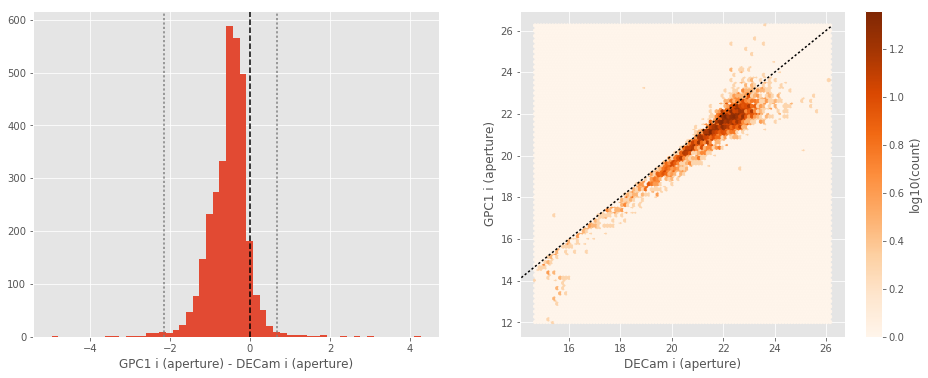

GPC1 i (total) - DECam i (total):
- Median: -0.30
- Median Absolute Deviation: 0.27
- 1% percentile: -1.811922836303711
- 99% percentile: 0.6984682083129893


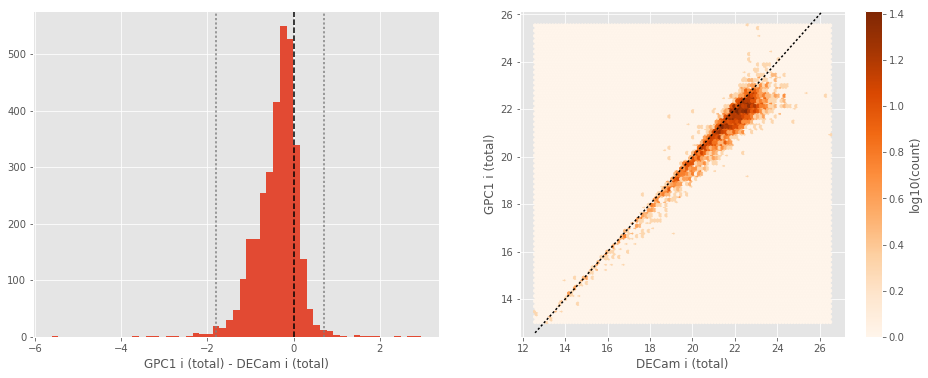

SUPRIME i (aperture) - KIDS i (aperture):
- Median: -0.05
- Median Absolute Deviation: 0.24
- 1% percentile: -2.310871467590332
- 99% percentile: 1.4244997406005862


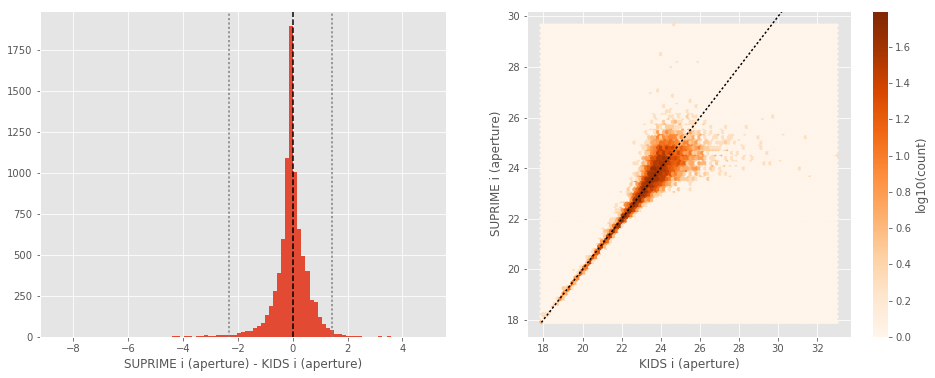

SUPRIME i (total) - KIDS i (total):
- Median: -0.32
- Median Absolute Deviation: 0.32
- 1% percentile: -3.4855447769165044
- 99% percentile: 1.2716686248779248


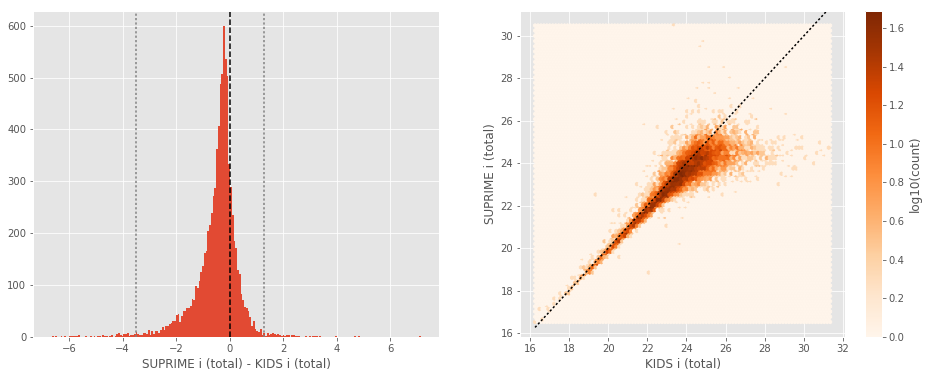

GPC1 i (aperture) - KIDS i (aperture):
- Median: -0.18
- Median Absolute Deviation: 0.21
- 1% percentile: -1.3263696289062499
- 99% percentile: 1.1674452209472674


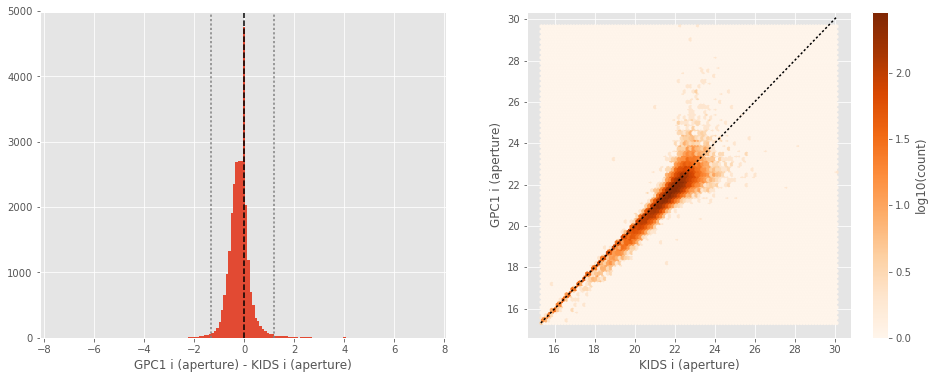

GPC1 i (total) - KIDS i (total):
- Median: 0.01
- Median Absolute Deviation: 0.14
- 1% percentile: -1.5862361145019532
- 99% percentile: 0.8990871429443367


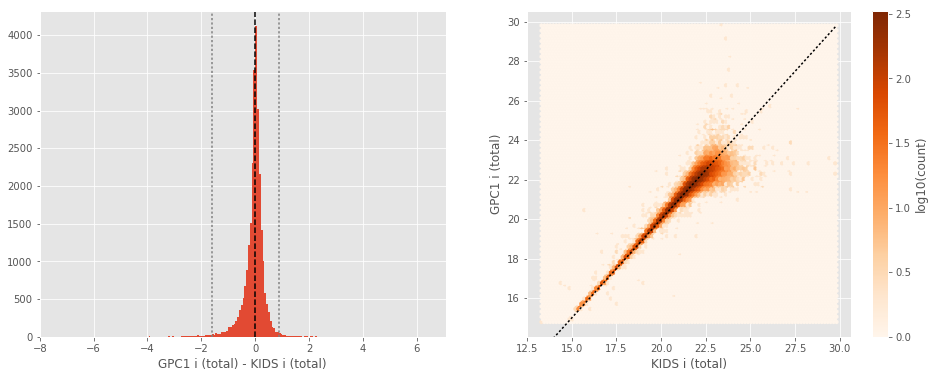

GPC1 i (aperture) - SUPRIME i (aperture):
- Median: -0.14
- Median Absolute Deviation: 0.22
- 1% percentile: -1.4016206169128416
- 99% percentile: 0.8329959678649892


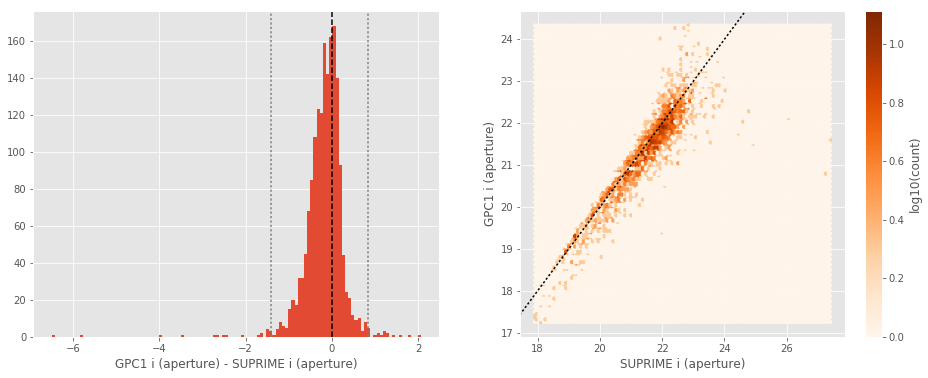

GPC1 i (total) - SUPRIME i (total):
- Median: 0.19
- Median Absolute Deviation: 0.13
- 1% percentile: -1.0964227294921876
- 99% percentile: 0.8882879066467282


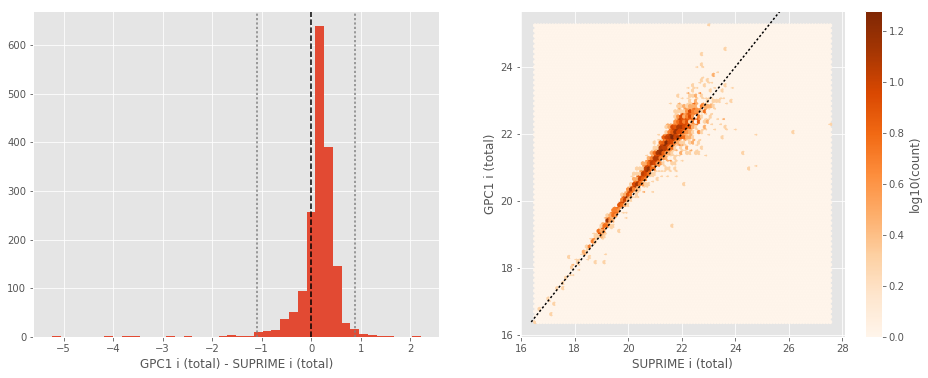

No sources have both Megacam z (aperture) and DECam z (aperture) values.
No sources have both Megacam z (total) and DECam z (total) values.
SUPRIME z (aperture) - Megacam z (aperture):
- Median: -0.08
- Median Absolute Deviation: 0.24
- 1% percentile: -2.3745236587524414
- 99% percentile: 2.003346042633059


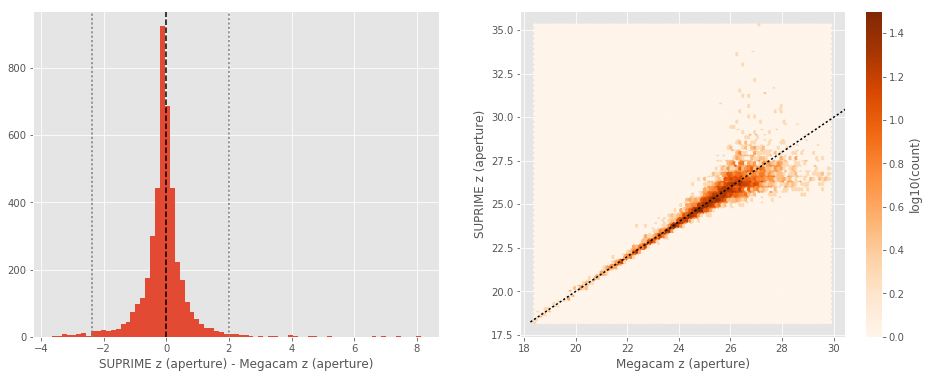

SUPRIME z (total) - Megacam z (total):
- Median: -0.16
- Median Absolute Deviation: 0.28
- 1% percentile: -2.864499092102051
- 99% percentile: 2.0286102294921906


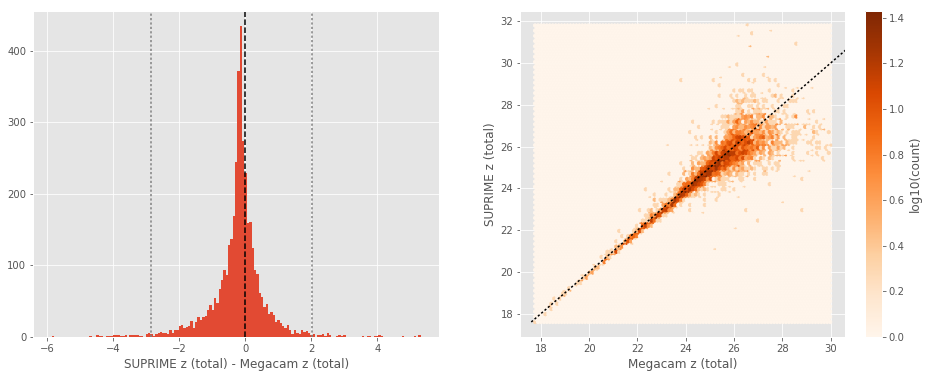

GPC1 z (aperture) - Megacam z (aperture):
- Median: -0.12
- Median Absolute Deviation: 0.16
- 1% percentile: -1.4026638793945312
- 99% percentile: 1.4951512908935523


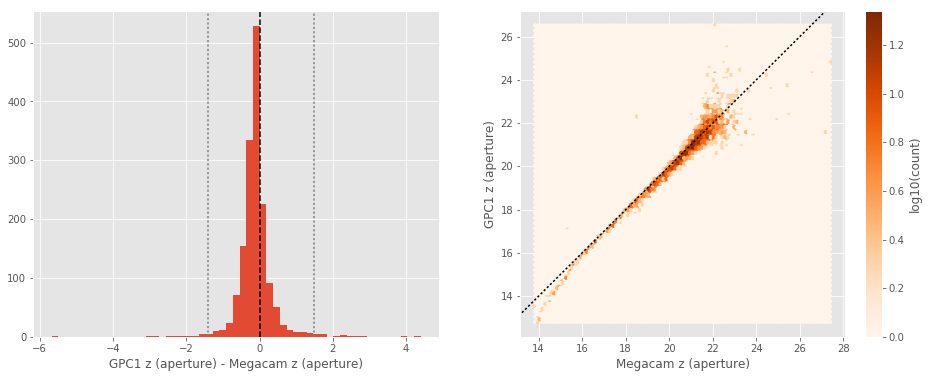

GPC1 z (total) - Megacam z (total):
- Median: 0.12
- Median Absolute Deviation: 0.13
- 1% percentile: -1.3849009704589843
- 99% percentile: 1.0061263465881352


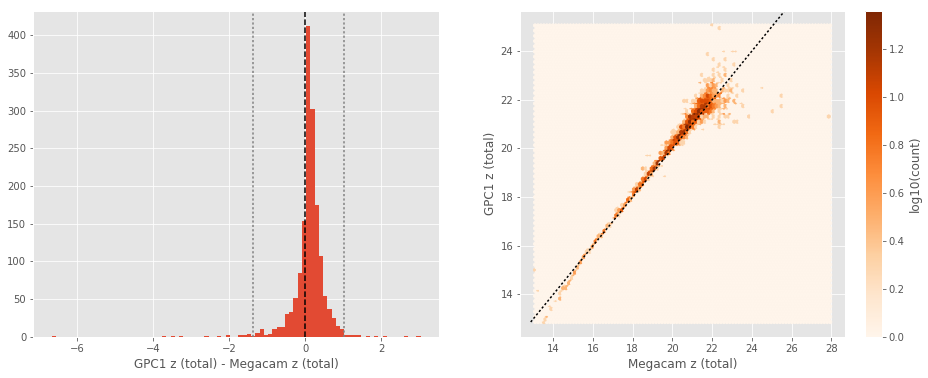

No sources have both DECam z (aperture) and SUPRIME z (aperture) values.
No sources have both DECam z (total) and SUPRIME z (total) values.
No sources have both DECam z (aperture) and GPC1 z (aperture) values.
No sources have both DECam z (total) and GPC1 z (total) values.
GPC1 z (aperture) - SUPRIME z (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.25
- 1% percentile: -1.4532188987731935
- 99% percentile: 1.610495319366446


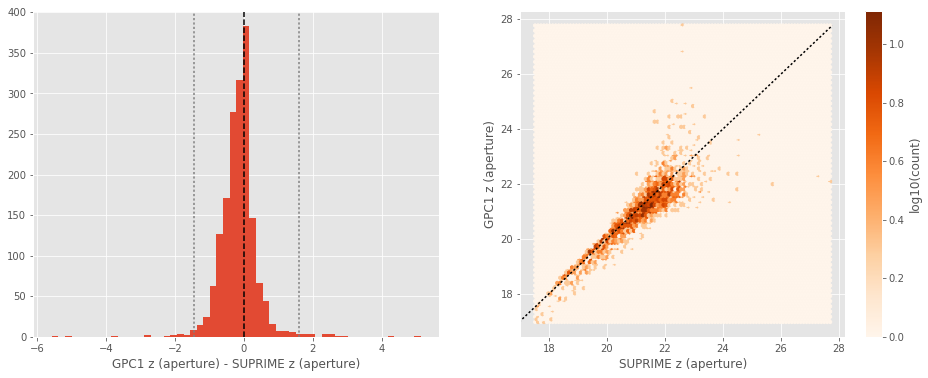

GPC1 z (total) - SUPRIME z (total):
- Median: 0.20
- Median Absolute Deviation: 0.16
- 1% percentile: -1.5674185752868652
- 99% percentile: 1.364116954803464


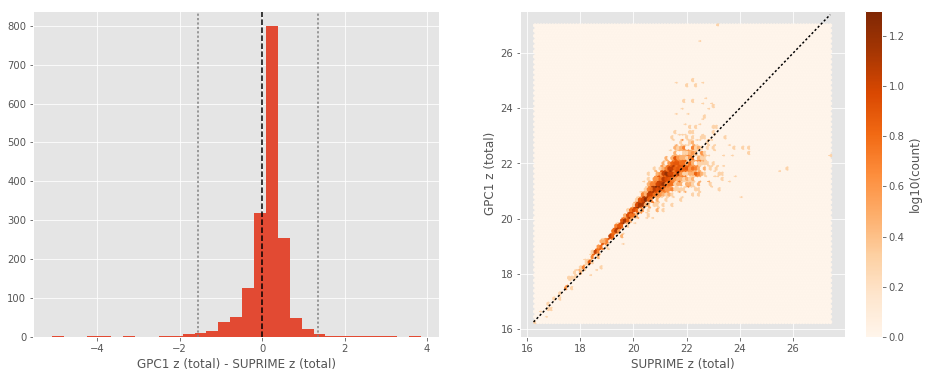

SUPRIME y (aperture) - DECam y (aperture):
- Median: -0.09
- Median Absolute Deviation: 0.26
- 1% percentile: -3.2492724609375
- 99% percentile: 1.2991540527343735


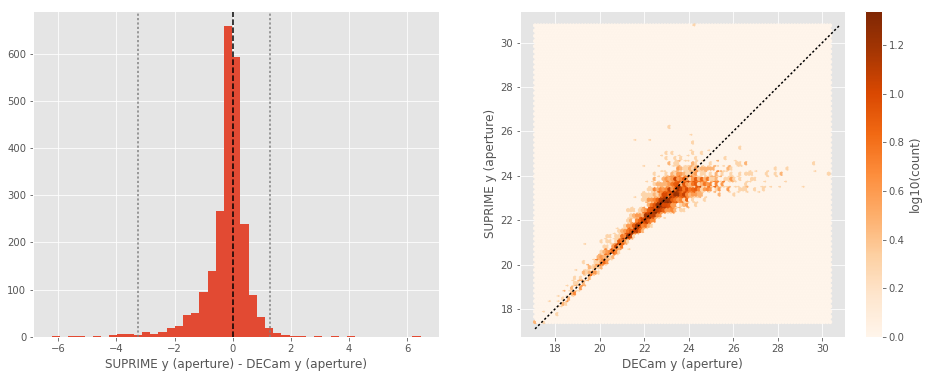

SUPRIME y (total) - DECam y (total):
- Median: -0.18
- Median Absolute Deviation: 0.17
- 1% percentile: -1.4482554626464843
- 99% percentile: 1.0785585021972657


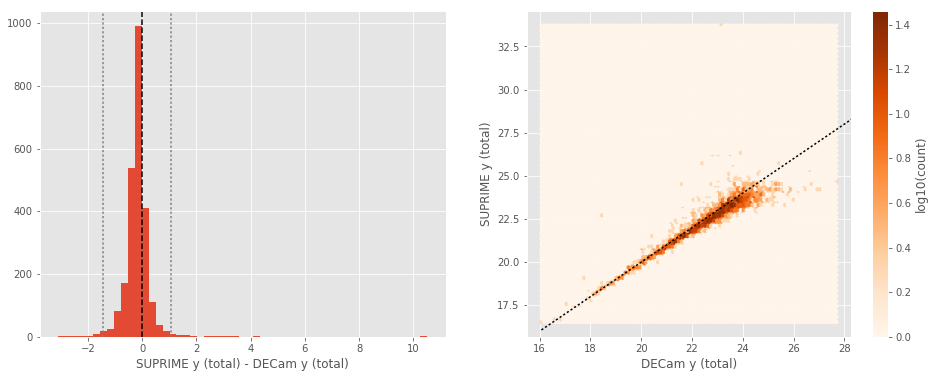

GPC1 y (aperture) - DECam y (aperture):
- Median: -0.20
- Median Absolute Deviation: 0.25
- 1% percentile: -2.5430140113830566
- 99% percentile: 1.7774703216552754


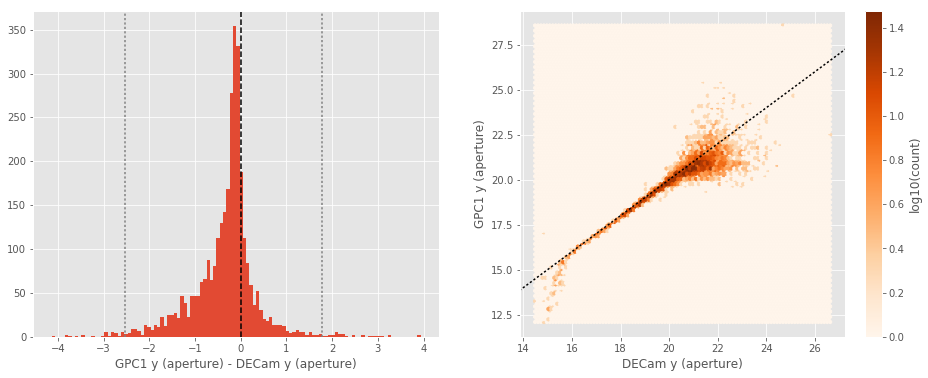

GPC1 y (total) - DECam y (total):
- Median: 0.03
- Median Absolute Deviation: 0.30
- 1% percentile: -2.6641544342041015
- 99% percentile: 2.3969280242919933


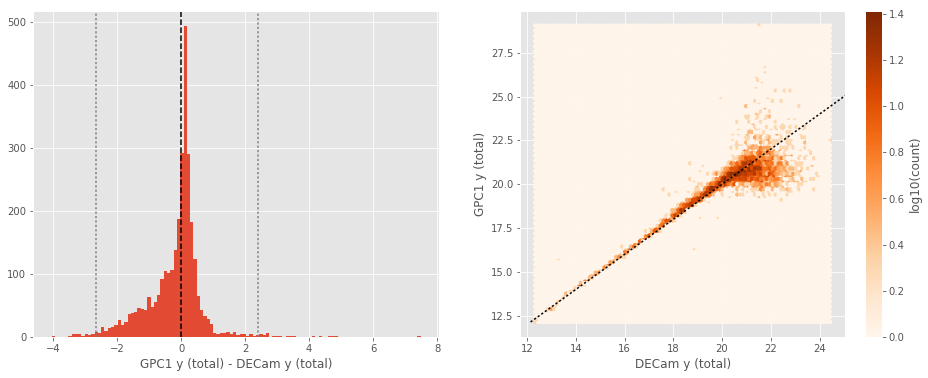

GPC1 y (aperture) - SUPRIME y (aperture):
- Median: -0.35
- Median Absolute Deviation: 0.38
- 1% percentile: -2.6543828773498532
- 99% percentile: 1.6077361488342303


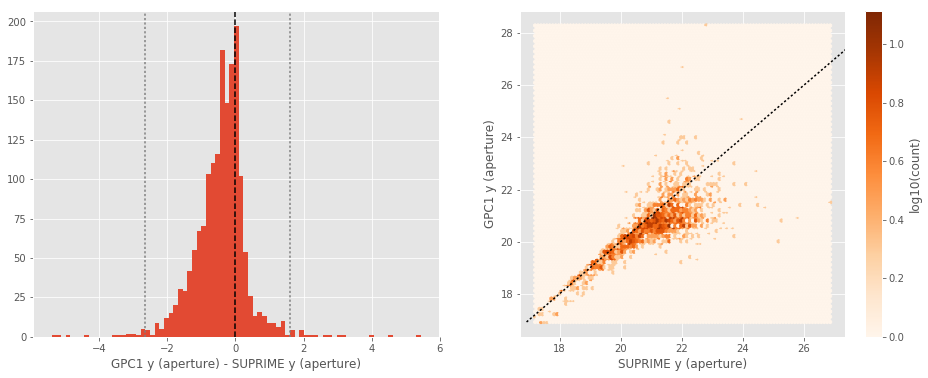

GPC1 y (total) - SUPRIME y (total):
- Median: 0.00
- Median Absolute Deviation: 0.36
- 1% percentile: -2.8337425994873047
- 99% percentile: 2.234477539062499


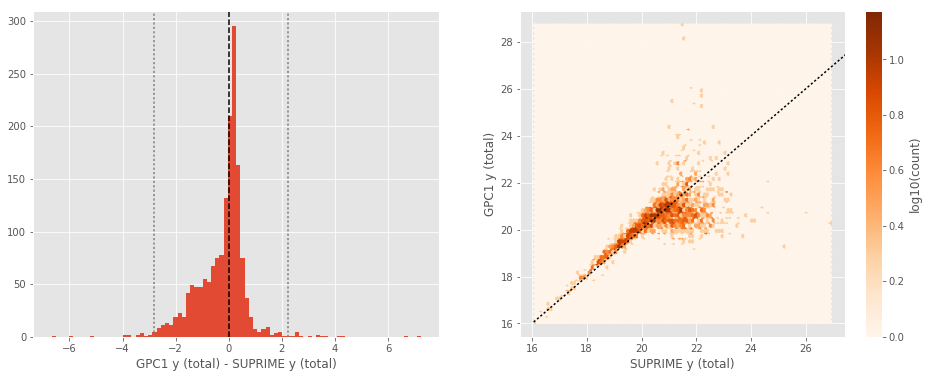

In [19]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):
        
        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)))
        
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (total)".format(band1), "{} (total)".format(band2)))

## III - Comparing magnitudes to reference bands

Cross-match the master list to SDSS and 2MASS to compare its magnitudes to SDSS and 2MASS ones.

In [20]:
master_catalogue_coords = SkyCoord(master_catalogue['ra'], master_catalogue['dec'])

### III.a - Comparing u, g, r, i, and z bands to SDSS

The catalogue is cross-matched to SDSS-DR13 withing 0.2 arcsecond. 

We compare the u, g, r, i, and z magnitudes to those from SDSS using `fiberMag` for the aperture magnitude and `petroMag`  for the total magnitude.

In [21]:
sdss = Table.read("../../dmu0/dmu0_SDSS-DR13/data/SDSS-DR13_COSMOS.fits")
sdss_coords = SkyCoord(sdss['ra'] * u.deg, sdss['dec'] * u.deg)

idx, d2d, _ = sdss_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

sdss = sdss[mask]
ml_sdss_idx = idx[mask]

Megacam u (aperture) - SDSS u (fiberMag):
- Median: -0.22
- Median Absolute Deviation: 0.50
- 1% percentile: -1.937181854248047
- 99% percentile: 2.9591597366333


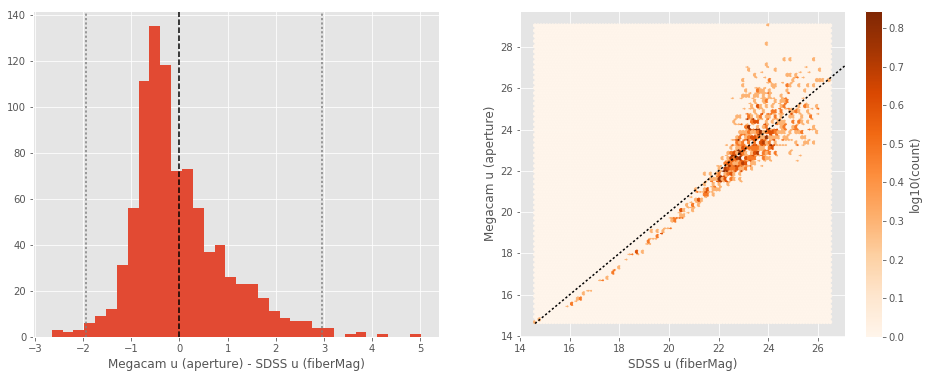

Megacam u (total) - SDSS u (petroMag):
- Median: -0.03
- Median Absolute Deviation: 0.76
- 1% percentile: -4.044945030212403
- 99% percentile: 4.517822113037109


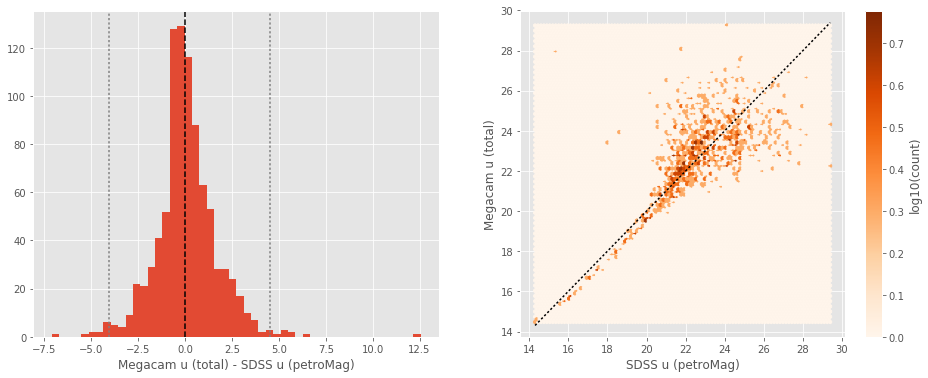

KIDS u (aperture) - SDSS u (fiberMag):
- Median: 0.10
- Median Absolute Deviation: 0.43
- 1% percentile: -1.6007099151611328
- 99% percentile: 3.067470550537114


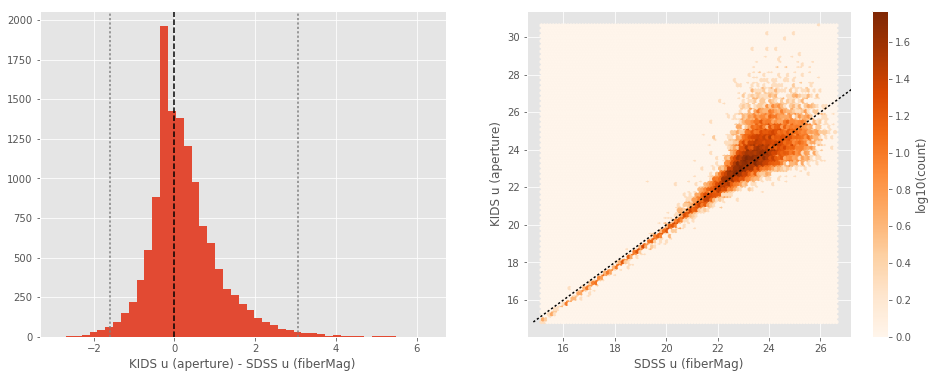

KIDS u (total) - SDSS u (petroMag):
- Median: 0.23
- Median Absolute Deviation: 0.76
- 1% percentile: -4.181077194213867
- 99% percentile: 4.597940292358398


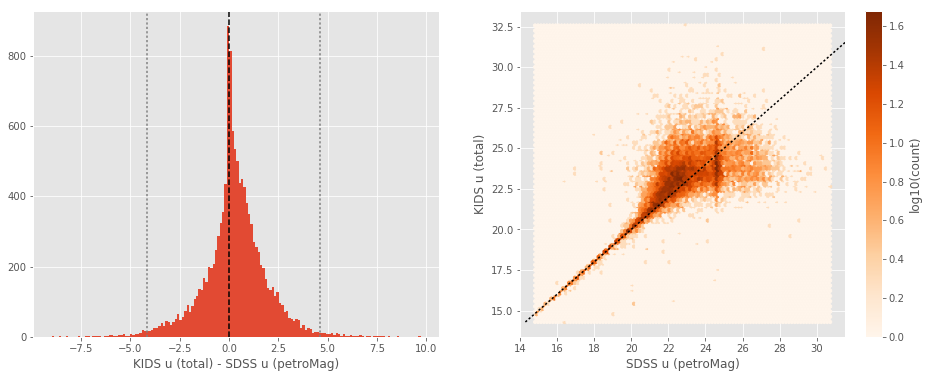

Megacam g (aperture) - SDSS g (fiberMag):
- Median: -0.34
- Median Absolute Deviation: 0.10
- 1% percentile: -1.1032917404174805
- 99% percentile: 0.5268235778808587


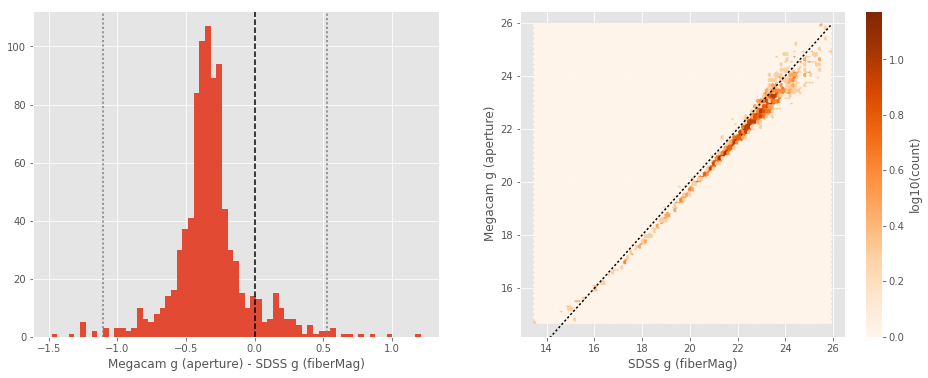

Megacam g (total) - SDSS g (petroMag):
- Median: -0.15
- Median Absolute Deviation: 0.21
- 1% percentile: -4.0725704956054685
- 99% percentile: 1.1520058822631831


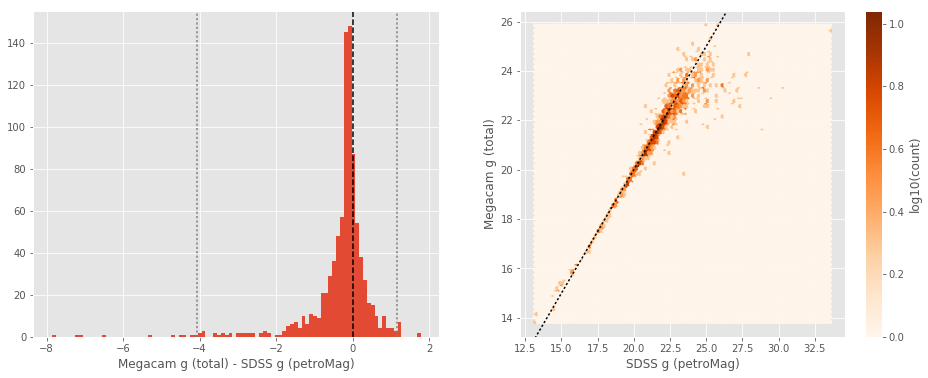

No sources have both SDSS g (fiberMag) and DECam g (aperture) values.
No sources have both SDSS g (petroMag) and DECam g (total) values.
KIDS g (aperture) - SDSS g (fiberMag):
- Median: -0.15
- Median Absolute Deviation: 0.15
- 1% percentile: -0.9216865158081055
- 99% percentile: 0.9880220794677728


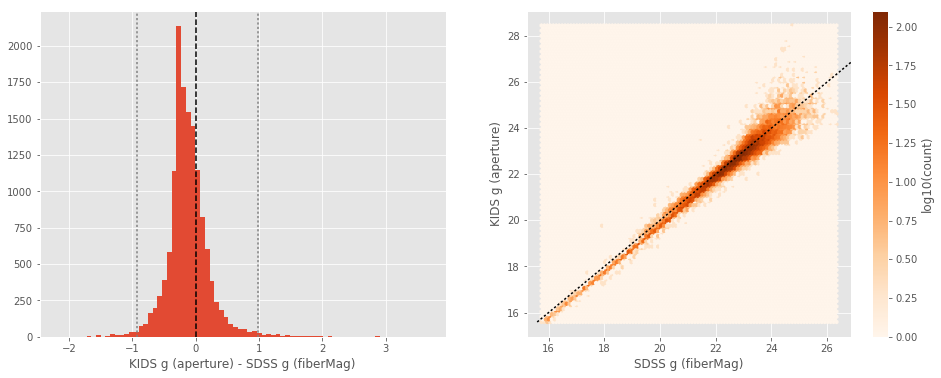

KIDS g (total) - SDSS g (petroMag):
- Median: 0.08
- Median Absolute Deviation: 0.23
- 1% percentile: -3.22764892578125
- 99% percentile: 2.0727901458740243


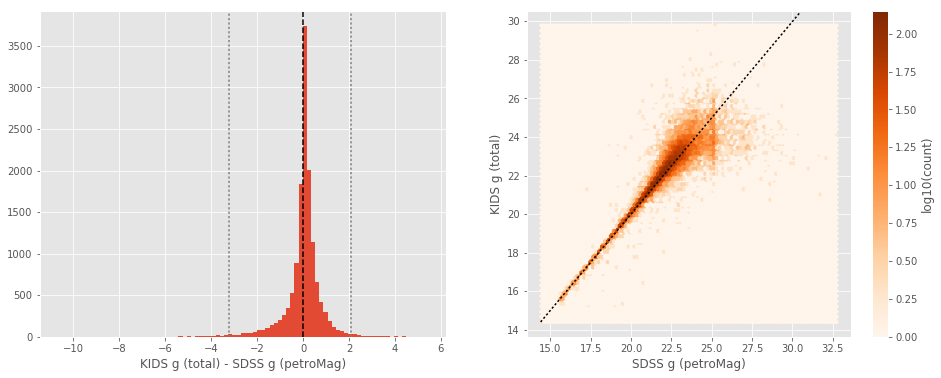

SUPRIME g (aperture) - SDSS g (fiberMag):
- Median: -0.24
- Median Absolute Deviation: 0.18
- 1% percentile: -0.9346055603027343
- 99% percentile: 17.953734283447183


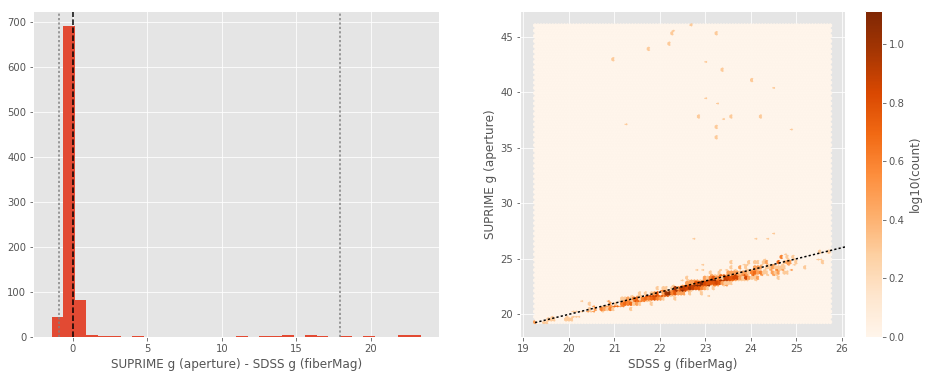

SUPRIME g (total) - SDSS g (petroMag):
- Median: -0.08
- Median Absolute Deviation: 0.24
- 1% percentile: -3.0446034431457507
- 99% percentile: 9.693692283630359


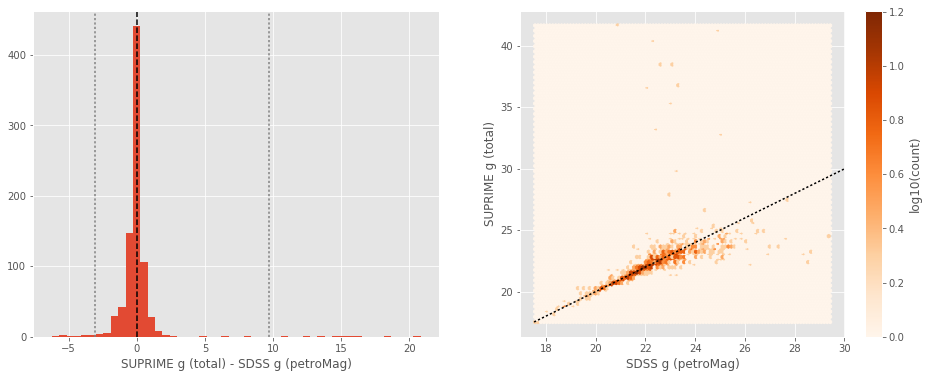

GPC1 g (aperture) - SDSS g (fiberMag):
- Median: -0.51
- Median Absolute Deviation: 0.26
- 1% percentile: -2.4366831970214844
- 99% percentile: 1.9779932022094666


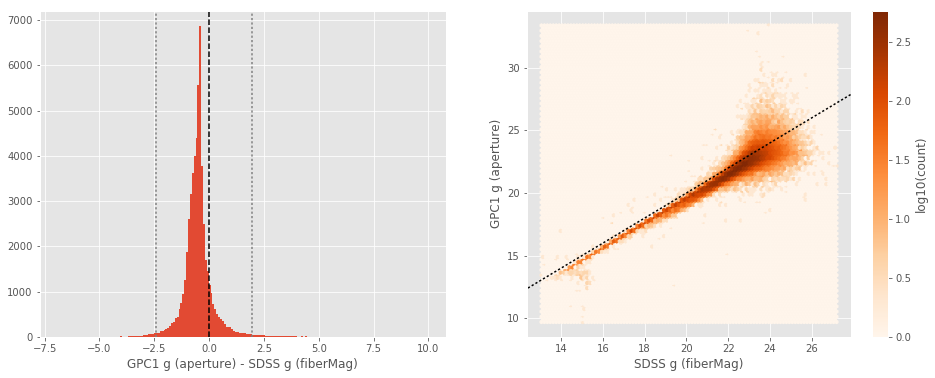

GPC1 g (total) - SDSS g (petroMag):
- Median: -0.09
- Median Absolute Deviation: 0.28
- 1% percentile: -4.29937391281128
- 99% percentile: 1.905803394317626


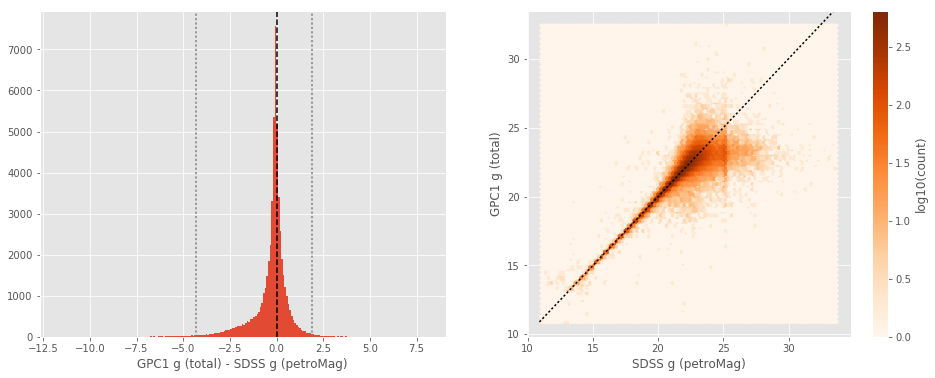

Megacam r (aperture) - SDSS r (fiberMag):
- Median: -0.25
- Median Absolute Deviation: 0.07
- 1% percentile: -1.0219140625
- 99% percentile: 0.5103611564636226


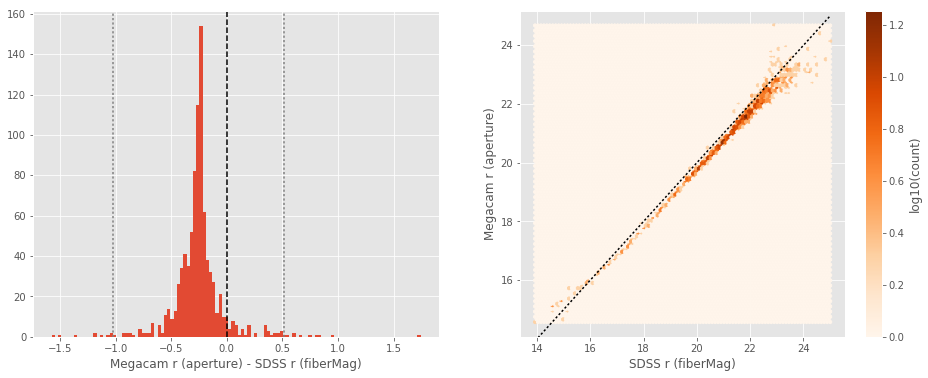

Megacam r (total) - SDSS r (petroMag):
- Median: -0.02
- Median Absolute Deviation: 0.14
- 1% percentile: -2.22525463104248
- 99% percentile: 1.0789746856689448


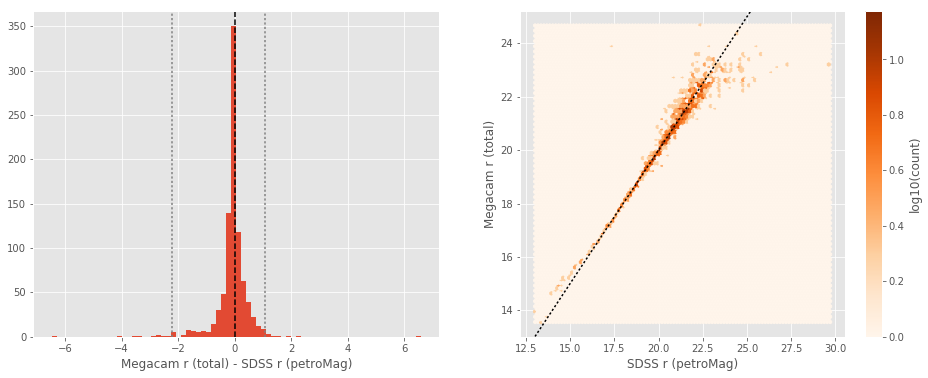

DECam r (aperture) - SDSS r (fiberMag):
- Median: 0.57
- Median Absolute Deviation: 0.35
- 1% percentile: -0.41360710144042967
- 99% percentile: 2.2291439819335936


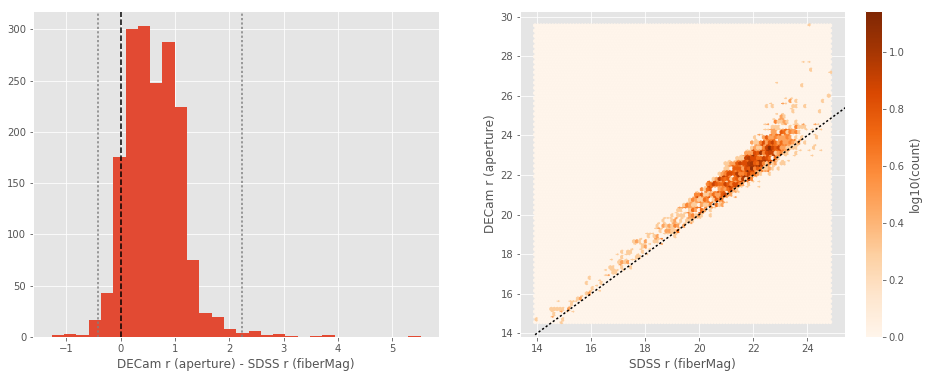

DECam r (total) - SDSS r (petroMag):
- Median: 0.94
- Median Absolute Deviation: 0.40
- 1% percentile: -1.3905937194824218
- 99% percentile: 2.6060064315795906


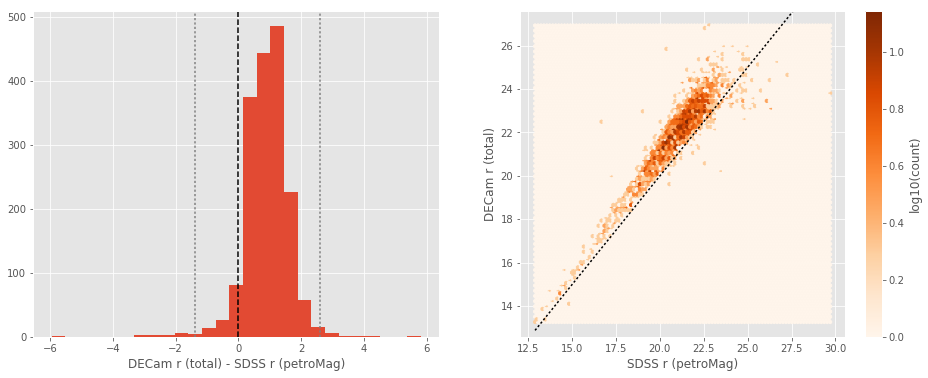

KIDS r (aperture) - SDSS r (fiberMag):
- Median: -0.25
- Median Absolute Deviation: 0.12
- 1% percentile: -0.9672468566894531
- 99% percentile: 0.37169662475585974


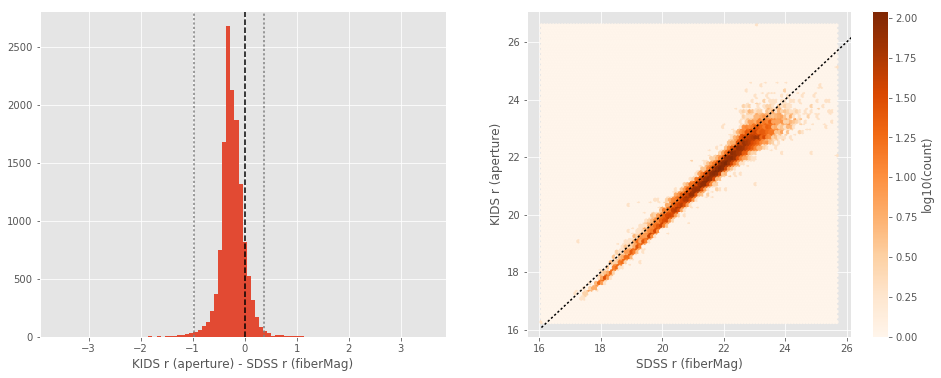

KIDS r (total) - SDSS r (petroMag):
- Median: -0.01
- Median Absolute Deviation: 0.15
- 1% percentile: -2.925017623901367
- 99% percentile: 1.2110549163818365


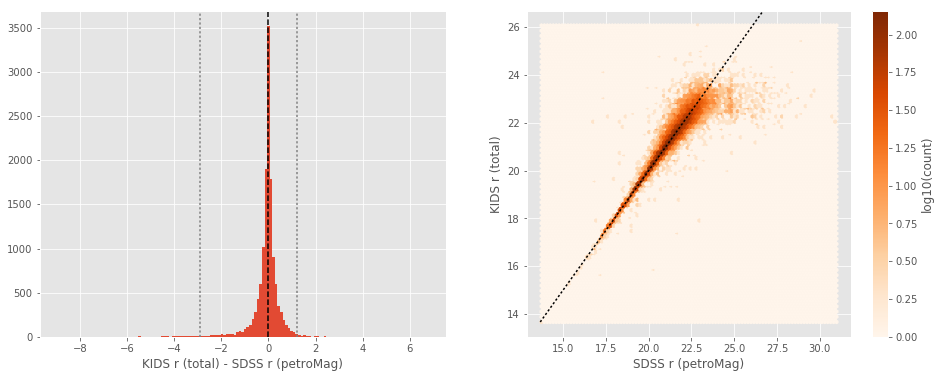

SUPRIME r (aperture) - SDSS r (fiberMag):
- Median: -0.26
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9658238220214843
- 99% percentile: 19.164604492187408


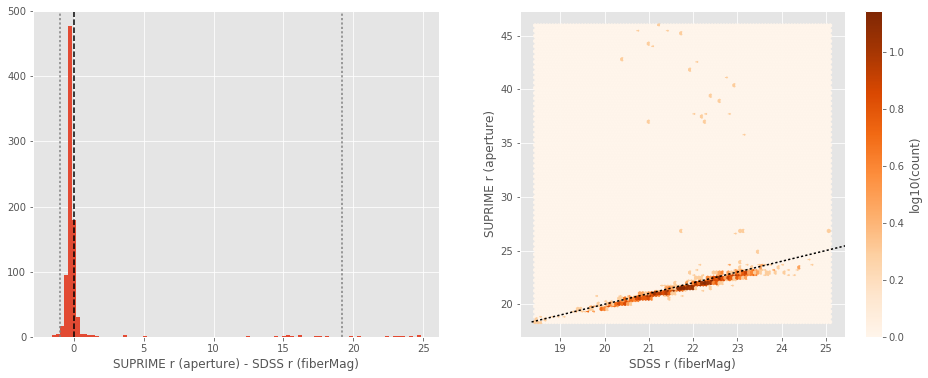

SUPRIME r (total) - SDSS r (petroMag):
- Median: -0.09
- Median Absolute Deviation: 0.19
- 1% percentile: -2.020179691314697
- 99% percentile: 8.448229980468746


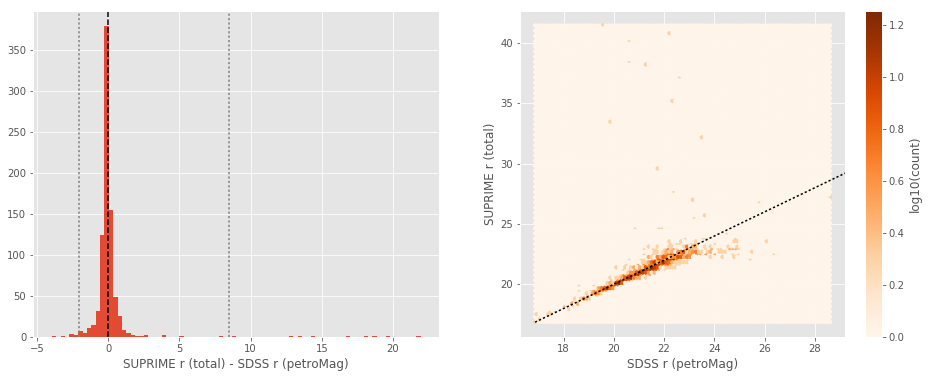

GPC1 r (aperture) - SDSS r (fiberMag):
- Median: -0.40
- Median Absolute Deviation: 0.16
- 1% percentile: -1.4502239227294922
- 99% percentile: 0.918971061706543


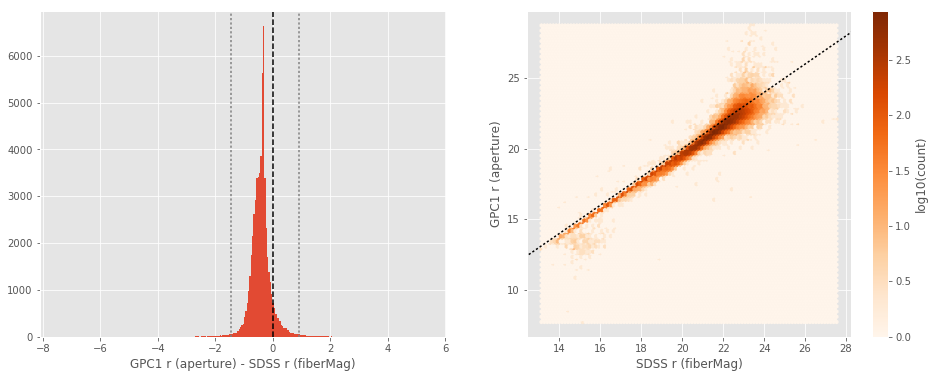

GPC1 r (total) - SDSS r (petroMag):
- Median: 0.03
- Median Absolute Deviation: 0.15
- 1% percentile: -2.8935000038146974
- 99% percentile: 1.3557196998596144


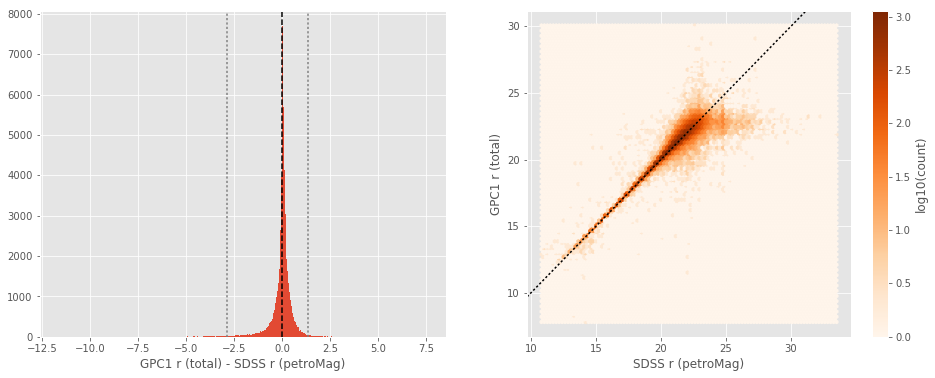

Megacam i (aperture) - SDSS i (fiberMag):
- Median: -0.28
- Median Absolute Deviation: 0.08
- 1% percentile: -0.9655761337280273
- 99% percentile: 0.5780568313598629


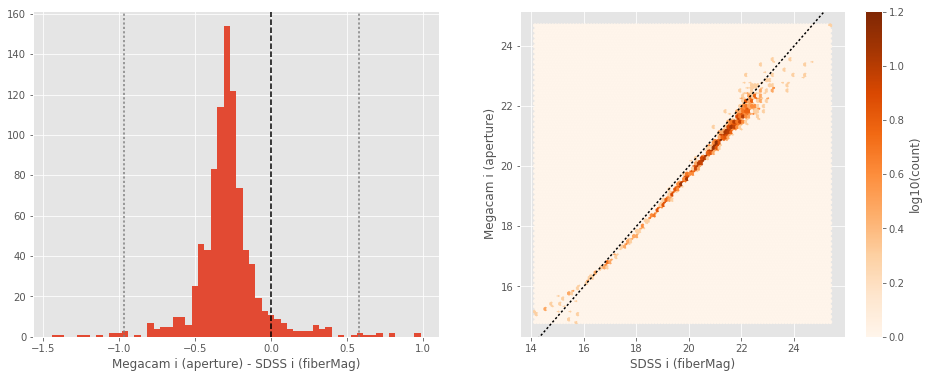

Megacam i (total) - SDSS i (petroMag):
- Median: -0.07
- Median Absolute Deviation: 0.14
- 1% percentile: -2.5687542343139644
- 99% percentile: 1.201734275817871


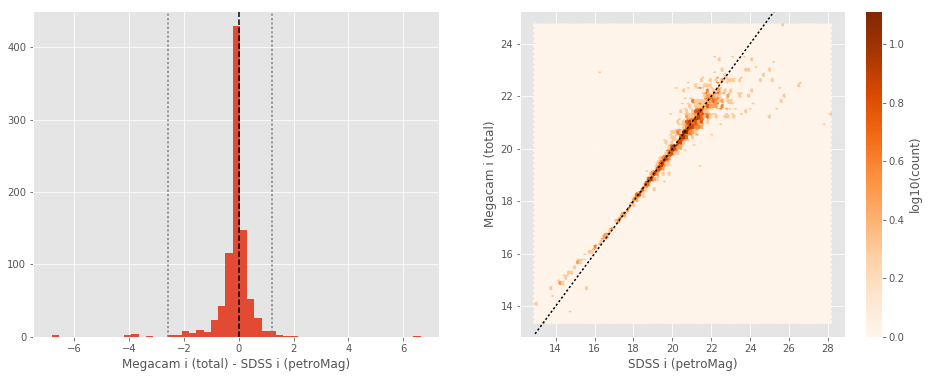

DECam i (aperture) - SDSS i (fiberMag):
- Median: -0.01
- Median Absolute Deviation: 0.20
- 1% percentile: -0.7605163192749023
- 99% percentile: 1.3602387619018563


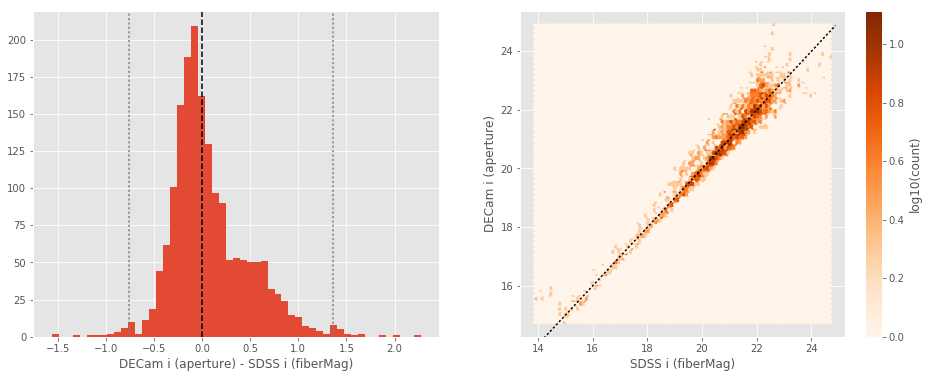

DECam i (total) - SDSS i (petroMag):
- Median: 0.32
- Median Absolute Deviation: 0.28
- 1% percentile: -2.7431631469726563
- 99% percentile: 1.6889904785156253


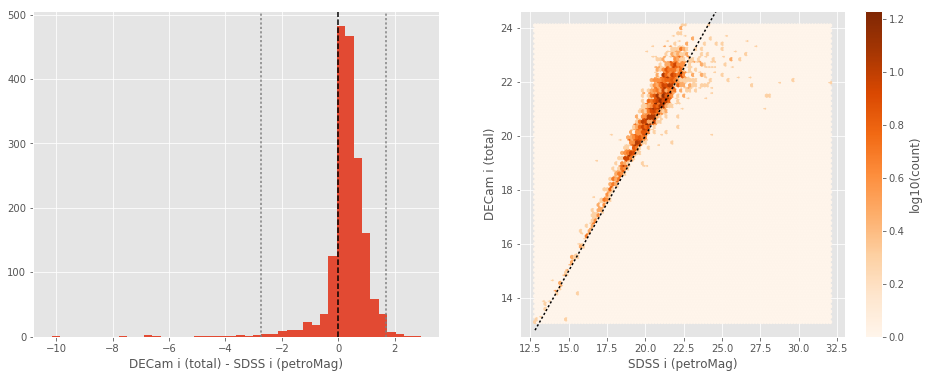

KIDS i (aperture) - SDSS i (fiberMag):
- Median: -0.23
- Median Absolute Deviation: 0.12
- 1% percentile: -0.8739645957946777
- 99% percentile: 0.46526798248291035


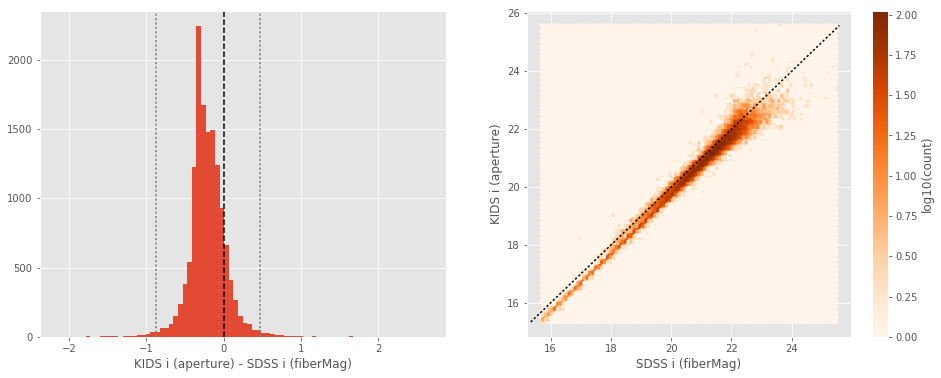

KIDS i (total) - SDSS i (petroMag):
- Median: 0.03
- Median Absolute Deviation: 0.16
- 1% percentile: -3.2406686210632323
- 99% percentile: 1.3401756858825686


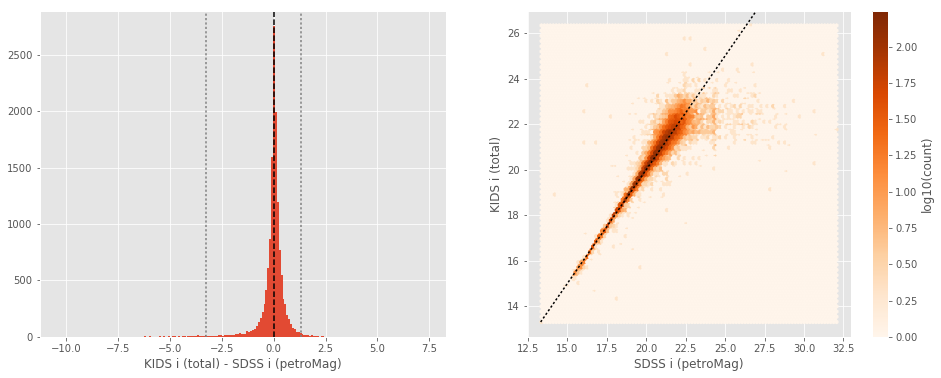

SUPRIME i (aperture) - SDSS i (fiberMag):
- Median: -0.28
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9561624526977539
- 99% percentile: 0.5491337776184082


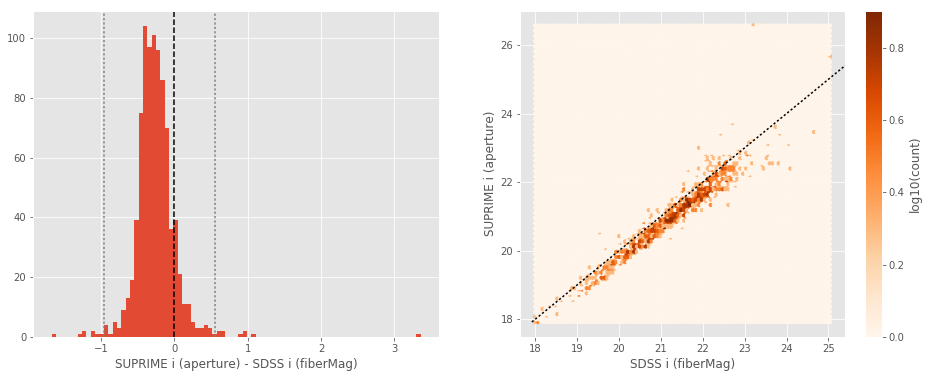

SUPRIME i (total) - SDSS i (petroMag):
- Median: -0.10
- Median Absolute Deviation: 0.17
- 1% percentile: -4.185044288635254
- 99% percentile: 1.0031447410583496


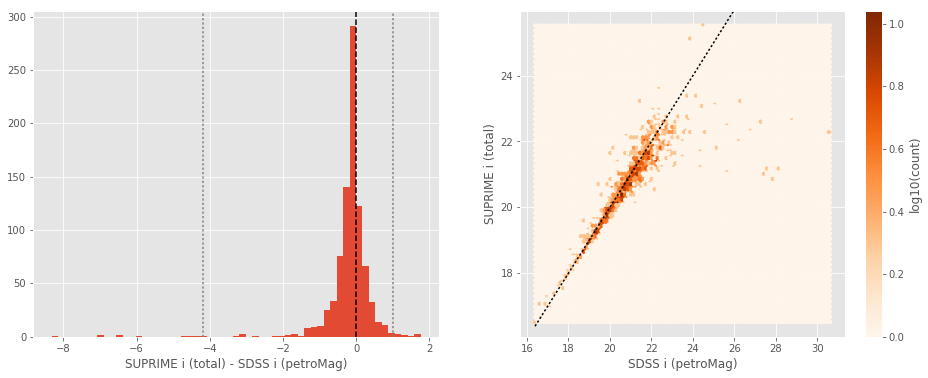

GPC1 i (aperture) - SDSS i (fiberMag):
- Median: -0.40
- Median Absolute Deviation: 0.13
- 1% percentile: -1.1375551223754883
- 99% percentile: 0.5163507461547852


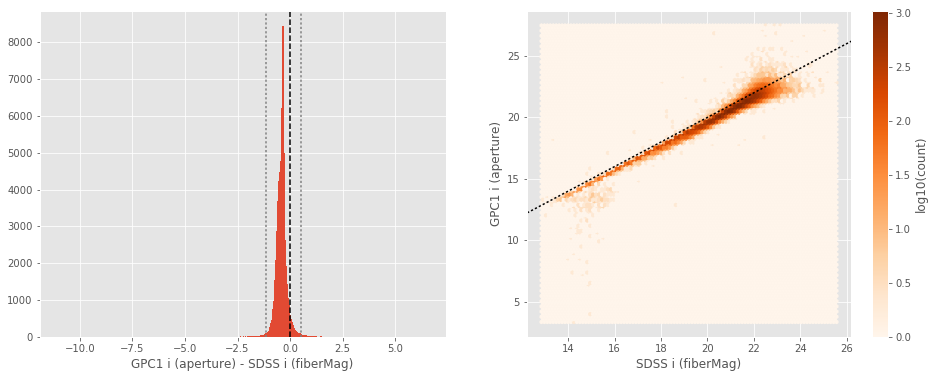

GPC1 i (total) - SDSS i (petroMag):
- Median: 0.05
- Median Absolute Deviation: 0.14
- 1% percentile: -3.095174293518067
- 99% percentile: 1.112330322265624


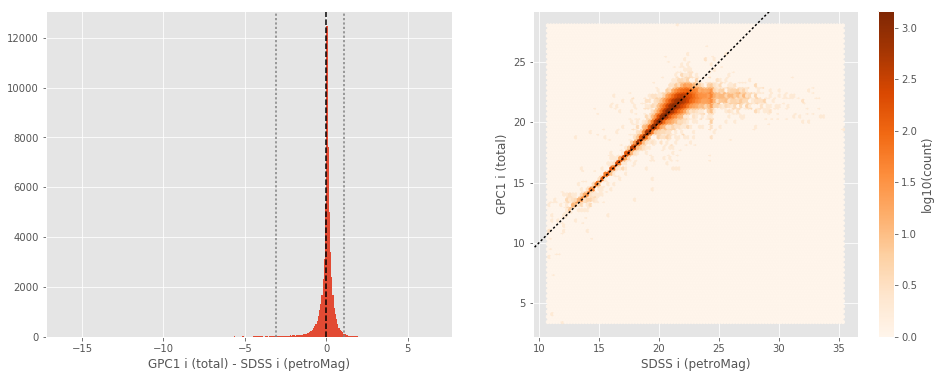

Megacam z (aperture) - SDSS z (fiberMag):
- Median: -0.16
- Median Absolute Deviation: 0.16
- 1% percentile: -1.5822505569458007
- 99% percentile: 0.9686499404907217


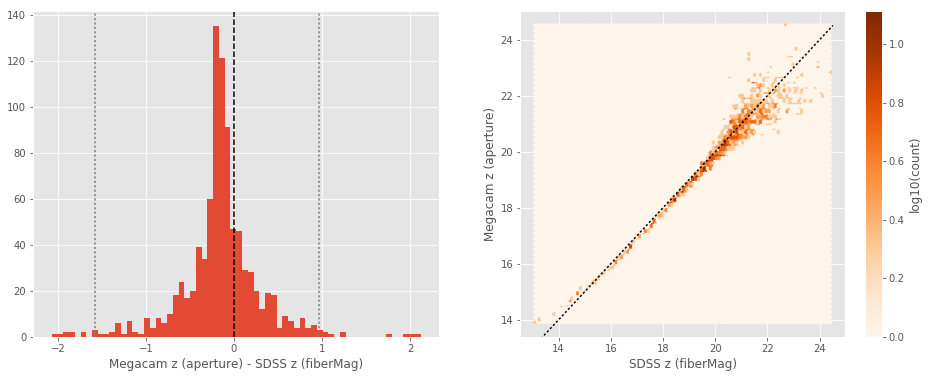

Megacam z (total) - SDSS z (petroMag):
- Median: 0.05
- Median Absolute Deviation: 0.34
- 1% percentile: -4.360620803833008
- 99% percentile: 2.2184482574462874


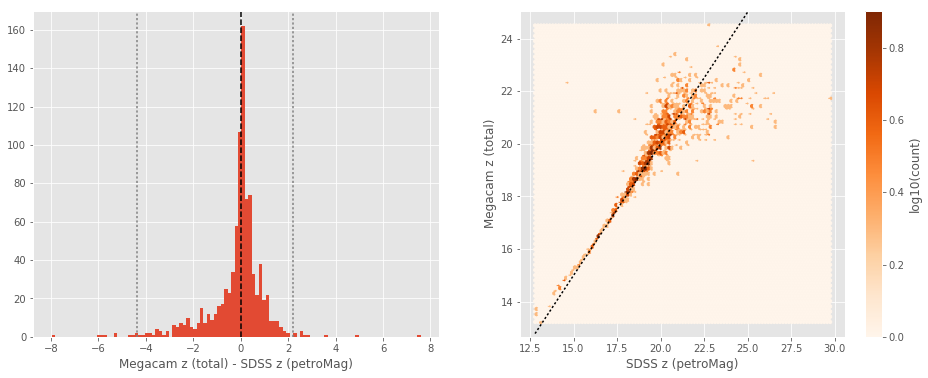

No sources have both SDSS z (fiberMag) and DECam z (aperture) values.
No sources have both SDSS z (petroMag) and DECam z (total) values.
SUPRIME z (aperture) - SDSS z (fiberMag):
- Median: -0.19
- Median Absolute Deviation: 0.23
- 1% percentile: -1.5709567070007324
- 99% percentile: 1.0227761268615723


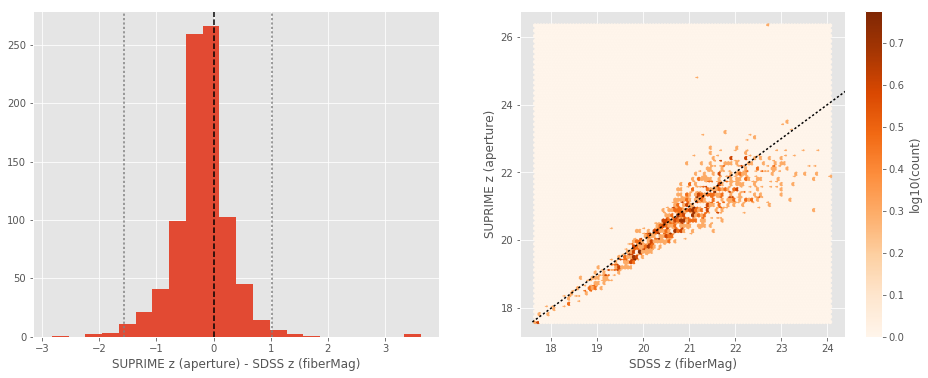

SUPRIME z (total) - SDSS z (petroMag):
- Median: -0.10
- Median Absolute Deviation: 0.46
- 1% percentile: -4.746883392333984
- 99% percentile: 1.9950613975524902


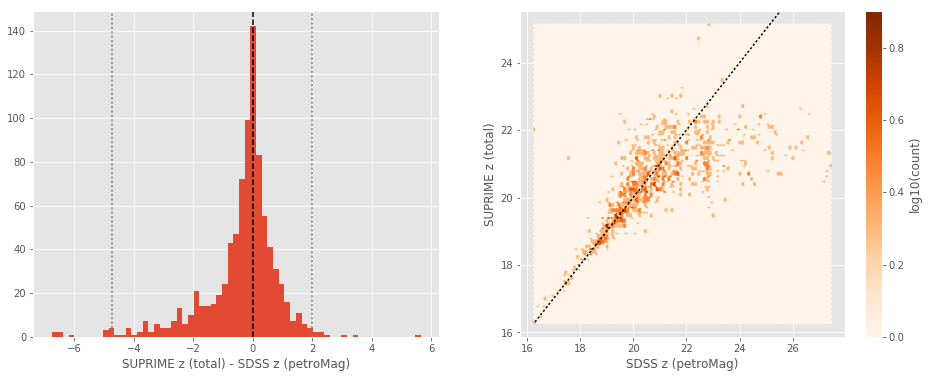

GPC1 z (aperture) - SDSS z (fiberMag):
- Median: -0.31
- Median Absolute Deviation: 0.19
- 1% percentile: -1.5797478485107423
- 99% percentile: 1.140282135009764


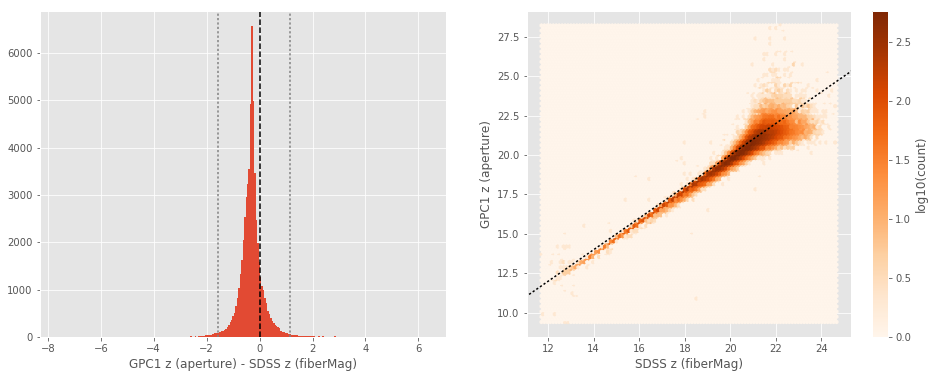

GPC1 z (total) - SDSS z (petroMag):
- Median: 0.10
- Median Absolute Deviation: 0.32
- 1% percentile: -4.19742603302002
- 99% percentile: 1.8786336898803697


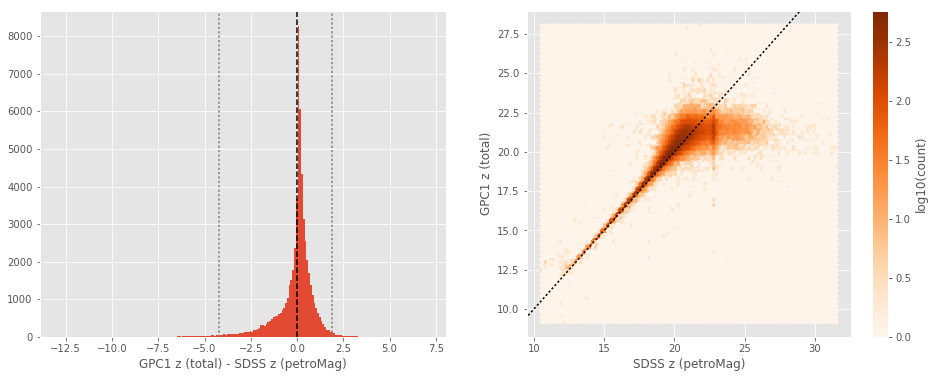

In [22]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands]:
    for band in band_of_a_kind:
        
        sdss_mag_ap = sdss["fiberMag_{}".format(band[-1])]
        master_cat_mag_ap = master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
    
        nb_compare_mags(sdss_mag_ap, master_cat_mag_ap,
                        labels=("SDSS {} (fiberMag)".format(band[-1]), "{} (aperture)".format(band)))
    
        sdss_mag_tot = sdss["petroMag_{}".format(band[-1])]
        master_cat_mag_tot = master_catalogue["m_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
        
        nb_compare_mags(sdss_mag_tot, master_cat_mag_tot,
                        labels=("SDSS {} (petroMag)".format(band[-1]), "{} (total)".format(band)))

### III.b - Comparing J and K bands to 2MASS

The catalogue is cross-matched to 2MASS-PSC withing 0.2 arcsecond. We compare the UKIDSS total J and K magnitudes to those from 2MASS.

The 2MASS magnitudes are “*Vega-like*” and we have to convert them to AB magnitudes using the zero points provided on [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4a.html):

| Band | Fν - 0 mag (Jy) |
|------|-----------------|
| J    | 1594            |
| H    | 1024            |
| Ks   | 666.7           |

In addition, UKIDSS uses a K band whereas 2MASS uses a Ks (“short”) band, [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4b.html) give a correction to convert the K band in a Ks band with the formula:

$$K_{s(2MASS)} = K_{UKIRT} + 0.003 + 0.004 * (J−K)_{UKIRT}$$

In [23]:
# The AB zero point is 3631 Jy
j_2mass_to_ab = 2.5 * np.log10(3631/1595)
k_2mass_to_ab = 2.5 * np.log10(3631/666.7)

In [25]:
twomass = Table.read("../../dmu0/dmu0_2MASS-point-sources/data/2MASS-PSC_COSMOS.fits")
twomass_coords = SkyCoord(twomass['raj2000'], twomass['dej2000'])

idx, d2d, _ = twomass_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

twomass = twomass[mask]
ml_twomass_idx = idx[mask]

UKIDSS J (total) - 2MASS J:
- Median: 0.06
- Median Absolute Deviation: 0.06
- 1% percentile: -0.7164157043363388
- 99% percentile: 2.9245293603609133


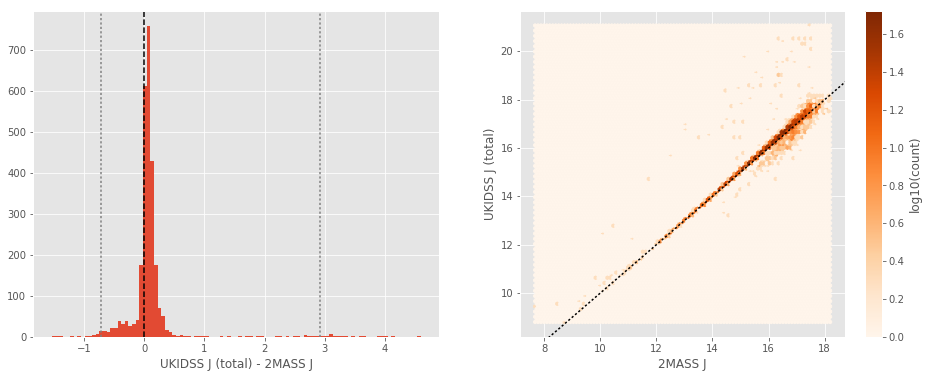

In [26]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_ukidss_j'][ml_twomass_idx],
                labels=("2MASS J", "UKIDSS J (total)"))

UKIDSS Ks-like (total) - 2MASS Ks:
- Median: 0.11
- Median Absolute Deviation: 0.08
- 1% percentile: -0.7428991718157342
- 99% percentile: 0.9002895557538457


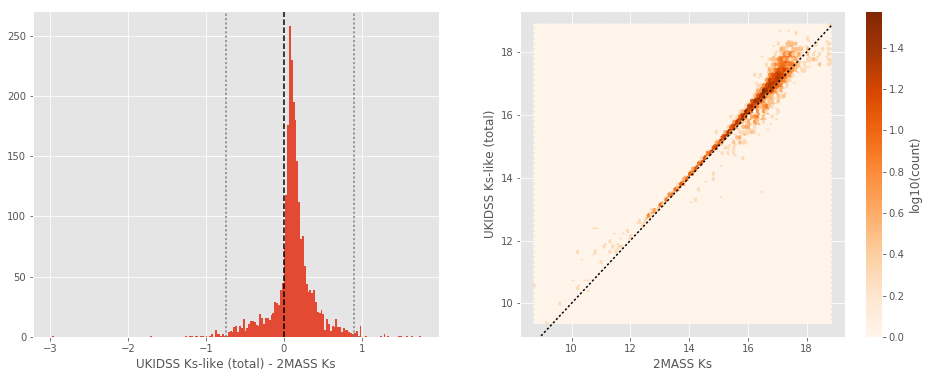

In [27]:
ukidss_ks_like = master_catalogue['m_ukidss_k'] + 0.003 + 0.004 * (
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'])
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, ukidss_ks_like[ml_twomass_idx],
                labels=("2MASS Ks", "UKIDSS Ks-like (total)"))

VISTA J (total) - 2MASS J:
- Median: -0.02
- Median Absolute Deviation: 0.04
- 1% percentile: -0.5246239037992296
- 99% percentile: 0.6426710962007609


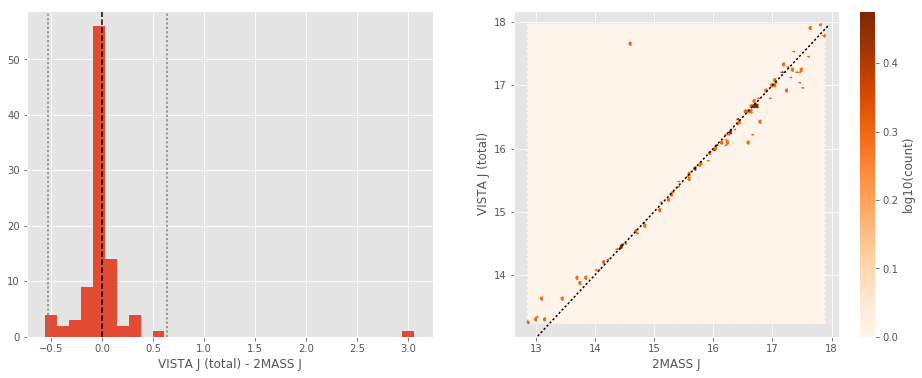

In [29]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_wirds_j'][ml_twomass_idx],
                labels=("2MASS J", "VISTA J (total)"))

VISTA Ks (total) - 2MASS Ks:
- Median: -0.02
- Median Absolute Deviation: 0.07
- 1% percentile: -1.0209944844683214
- 99% percentile: 0.6802905155316789


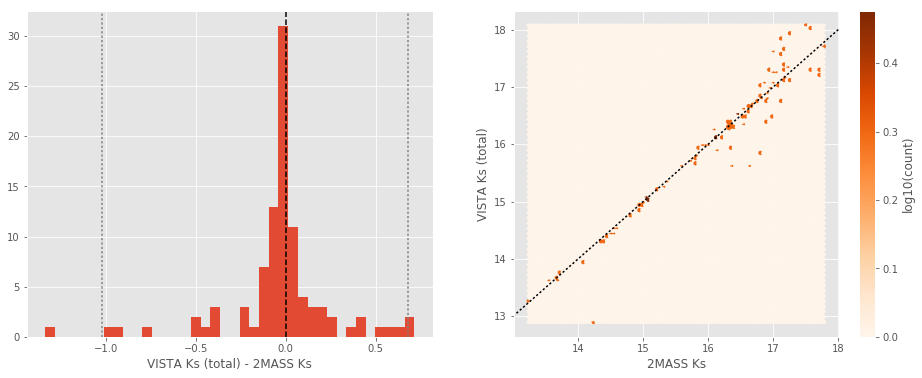

In [30]:
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, master_catalogue['m_wirds_ks'][ml_twomass_idx],
                labels=("2MASS Ks", "VISTA Ks (total)"))

## IV - Comparing aperture magnitudes to total ones.

Number of source used: 39897 / 403321 (9.89%)


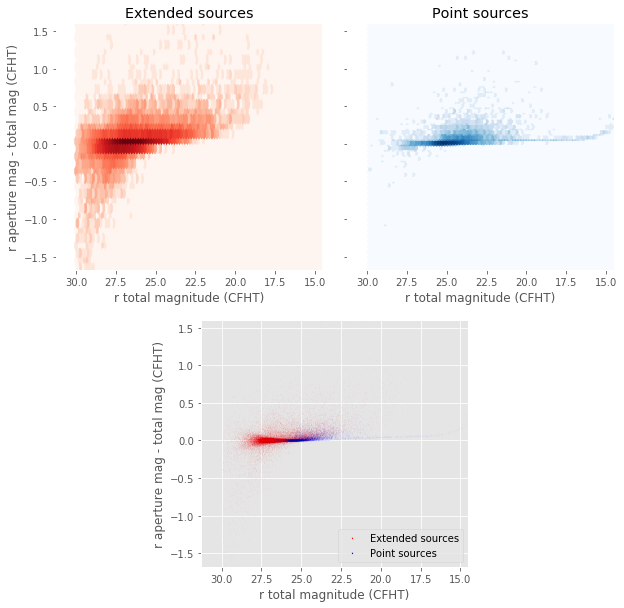

In [31]:
nb_ccplots(
    master_catalogue['m_megacam_r'],
    master_catalogue['m_ap_megacam_r'] - master_catalogue['m_megacam_r'],
    "r total magnitude (CFHT)", "r aperture mag - total mag (CFHT)",
    master_catalogue["stellarity"],
    invert_x=True
)

## V - Color-color and magnitude-color plots

Number of source used: 393 / 403321 (0.10%)


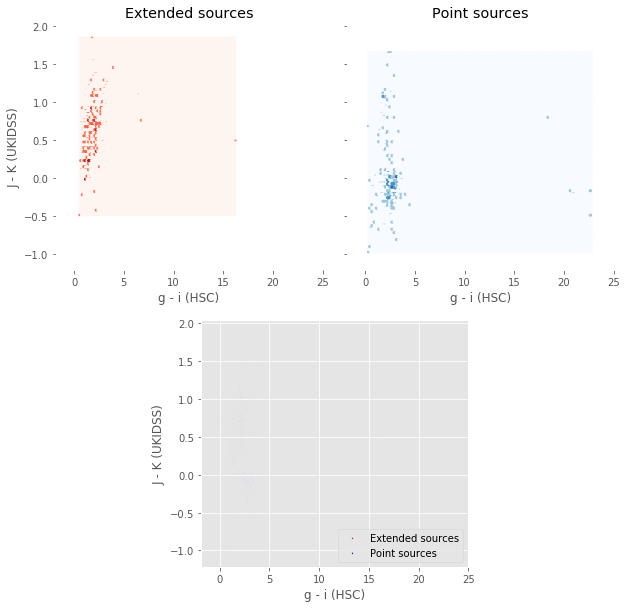

In [32]:
nb_ccplots(
    master_catalogue['m_suprime_g'] - master_catalogue['m_suprime_i'],
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    "g - i (HSC)", "J - K (UKIDSS)",
    master_catalogue["stellarity"]
)

Number of source used: 3351 / 403321 (0.83%)


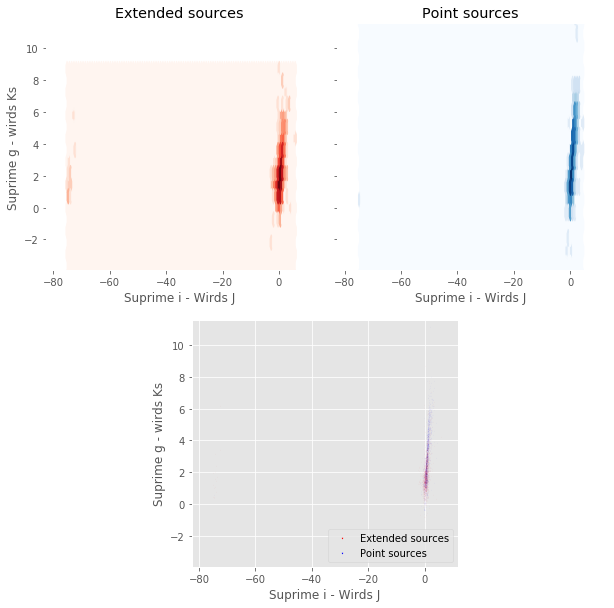

In [37]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_wirds_j'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_wirds_ks'],
    "Suprime i - Wirds J", "Suprime g - wirds Ks",
    master_catalogue["stellarity"]
)

Number of source used: 34226 / 403321 (8.49%)


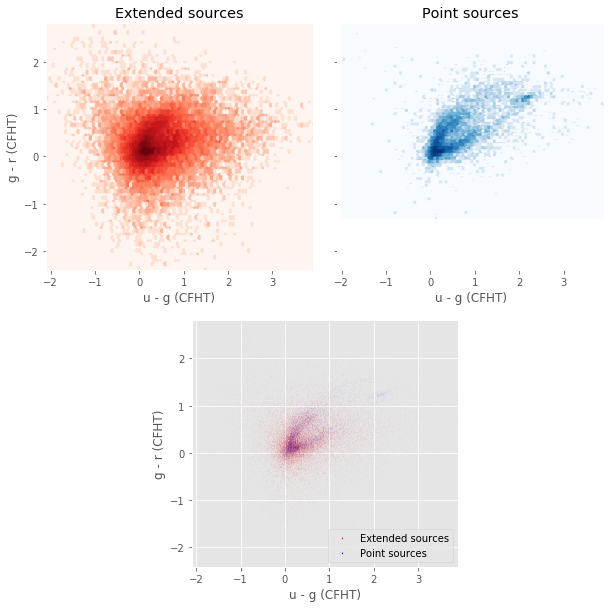

In [38]:
nb_ccplots(
    master_catalogue['m_megacam_u'] - master_catalogue['m_megacam_g'],
    master_catalogue['m_megacam_g'] - master_catalogue['m_megacam_r'],
    "u - g (CFHT)", "g - r (CFHT)",
    master_catalogue["stellarity"]
)

Number of source used: 393 / 403321 (0.10%)


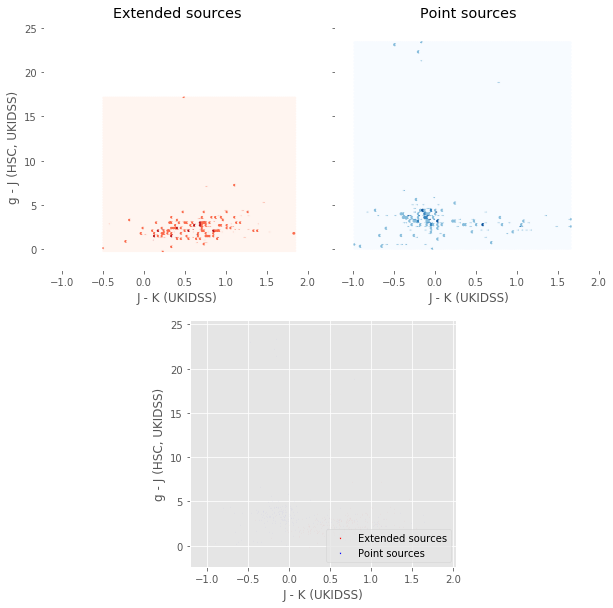

In [39]:
nb_ccplots(
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_ukidss_j'],
    "J - K (UKIDSS)", "g - J (HSC, UKIDSS)",
    master_catalogue["stellarity"]
)

Number of source used: 463 / 403321 (0.11%)


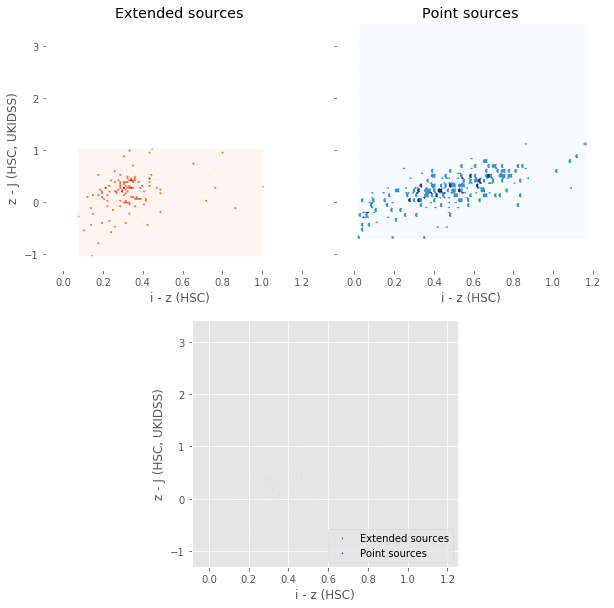

In [40]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_suprime_z'],
    master_catalogue['m_suprime_z'] - master_catalogue['m_ukidss_j'],
    "i - z (HSC)", "z - J (HSC, UKIDSS)",
    master_catalogue["stellarity"]
)